<a href="https://colab.research.google.com/github/furibeguerra/Vision_por_computadora_II/blob/main/EDA_Trashnet_Uribe_Caihuara_Version_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visión por Computadora II - Trabajo Final

##Fabian Andres Uribe Guerra
##Fabian Caihuara Sossa


# Kaggle - Origen de datos

In [3]:
!pip install kaggle opendatasets

In [4]:
from google.colab import files
files.upload() # Selecciona el archivo kaggle.json

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"fabinuribe","key":"8d363f644e17ca870b17bcb98de37c6a"}'}

In [5]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [6]:
!kaggle datasets download -d feyzazkefe/trashnet

Dataset URL: https://www.kaggle.com/datasets/feyzazkefe/trashnet
License(s): unknown
  0% 0.00/40.8M [00:00<?, ?B/s]
100% 40.8M/40.8M [00:00<00:00, 799MB/s]


In [7]:
!unzip trashnet.zip -d trashnet_images

Archive:  trashnet.zip
  inflating: trashnet_images/dataset-resized/cardboard/cardboard1.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard10.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard100.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard101.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard102.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard103.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard104.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard105.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard106.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard107.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard108.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard109.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard11.jpg  
  inflating: trashn

# 1. EDA

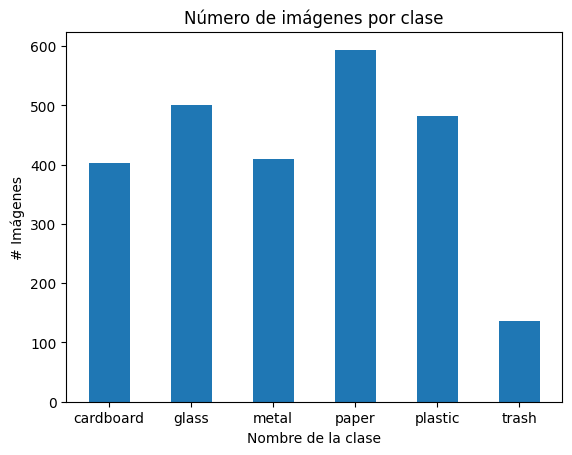

In [6]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


base_dir = '/content/trashnet_images/dataset-resized'
class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']
clases = {'cardboard': len(os.listdir(base_dir + '/cardboard')),
          'glass': len(os.listdir(base_dir + '/glass')),
          'metal': len(os.listdir(base_dir + '/metal')),
          'paper': len(os.listdir(base_dir + '/paper')),
          'plastic': len(os.listdir(base_dir + '/plastic')),
          'trash': len(os.listdir(base_dir + '/trash'))
          }

plt.bar(clases.keys(), clases.values(), width = .5);
plt.title("Número de imágenes por clase");
plt.xlabel('Nombre de la clase');
plt.ylabel('# Imágenes');

[########################################] | 100% Completed | 1.98 s
[########################################] | 100% Completed | 1.85 s
[########################################] | 100% Completed | 1.72 s
[########################################] | 100% Completed | 3.31 s
[########################################] | 100% Completed | 1.77 s
[########################################] | 100% Completed | 1.04 s


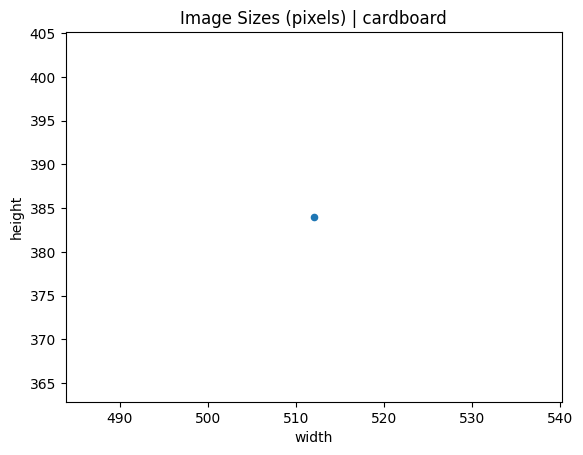

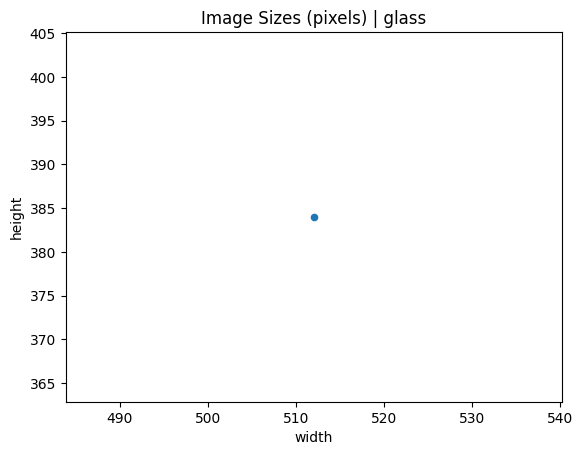

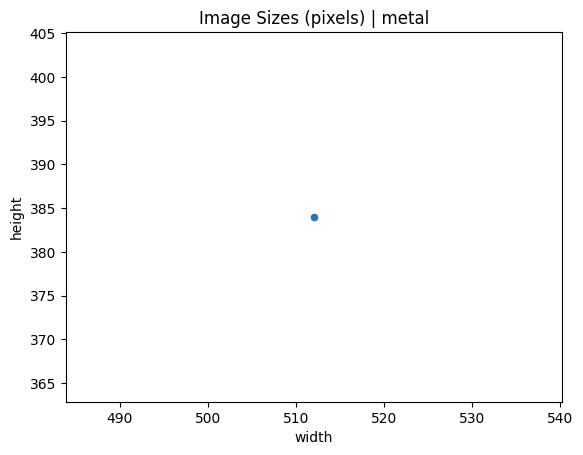

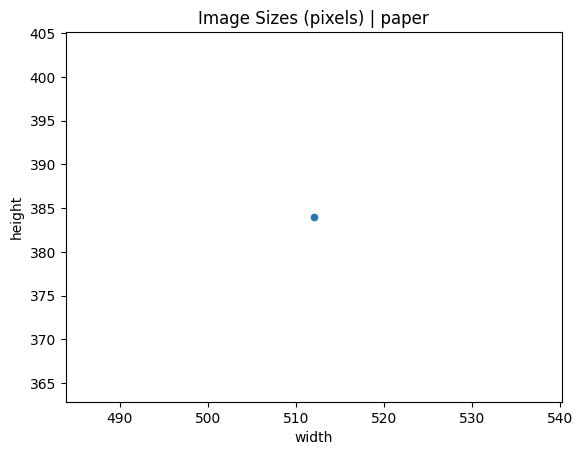

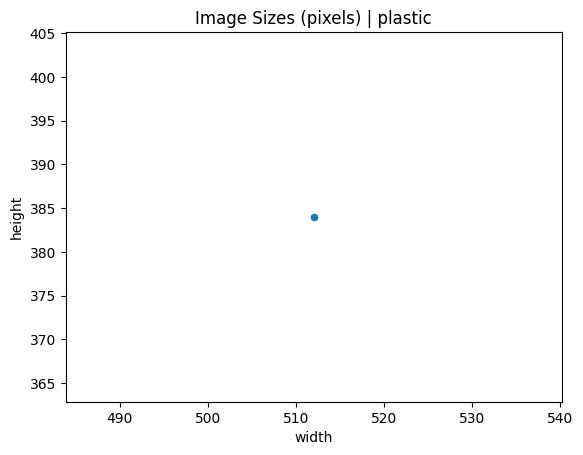

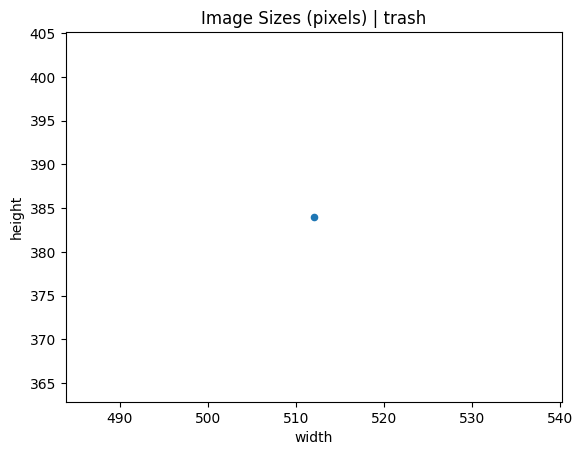

In [7]:
from dask import bag
from dask import diagnostics
from PIL import Image

rutas = {'cardboard': base_dir + '/cardboard/',
          'glass': base_dir + '/glass/',
          'metal': base_dir + '/metal/',
          'paper': base_dir + '/paper/',
          'plastic': base_dir + '/plastic/',
          'trash': base_dir + '/trash/'
          }

def get_dims(file):
  '''Returns dimenstions for an RBG image'''
  im = Image.open(file)
  arr = np.array(im)
  h,w,d = arr.shape
  return h,w

for n,d in rutas.items():
  filepath = d
  filelist = [filepath + f for f in os.listdir(filepath)]
  dims = bag.from_sequence(filelist).map(get_dims)
  with diagnostics.ProgressBar():
    dims = dims.compute()
    dim_df = pd.DataFrame(dims, columns=['height', 'width'])
    sizes = dim_df.groupby(['height', 'width']).size().reset_index().rename(columns={0:'count'})
    sizes.plot.scatter(x='width', y='height');
    plt.title('Image Sizes (pixels) | {}'.format(n))

Clase: CARDBOARD


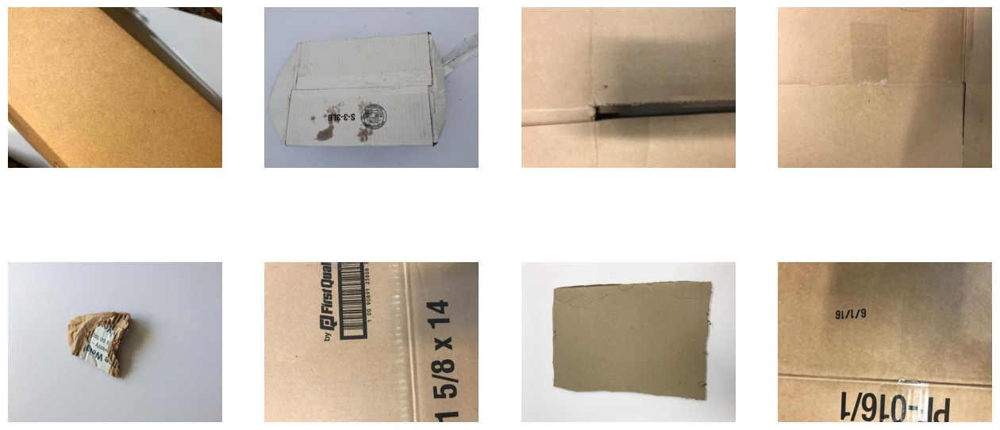

Clase: GLASS


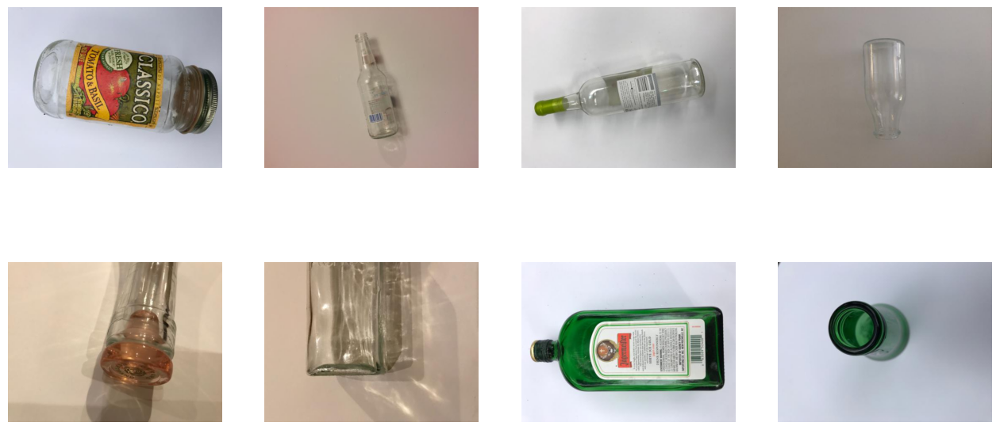

Clase: METAL


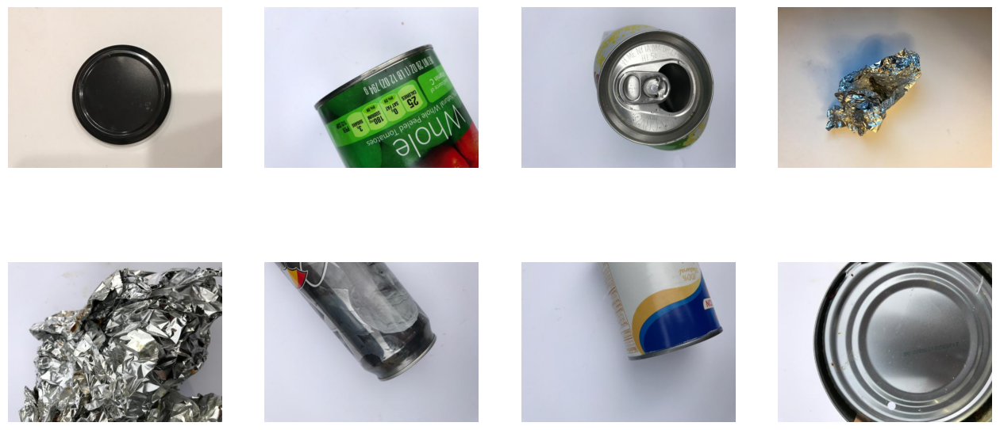

Clase: PAPER


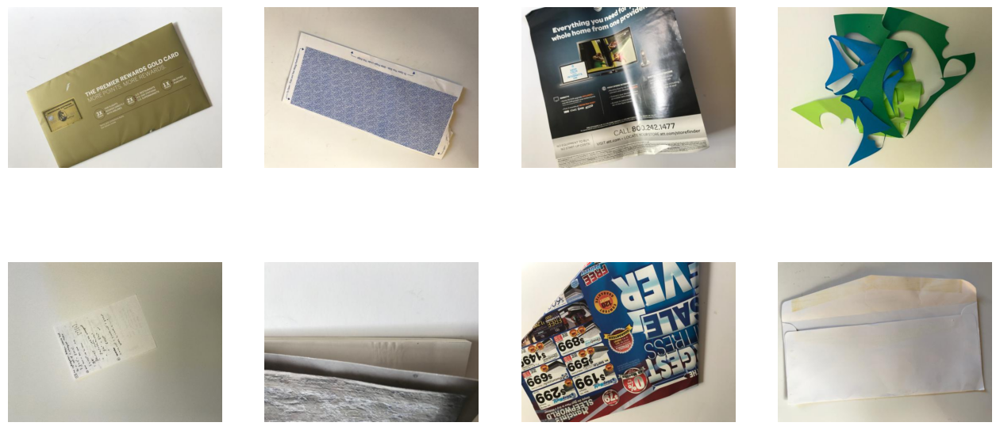

Clase: PLASTIC


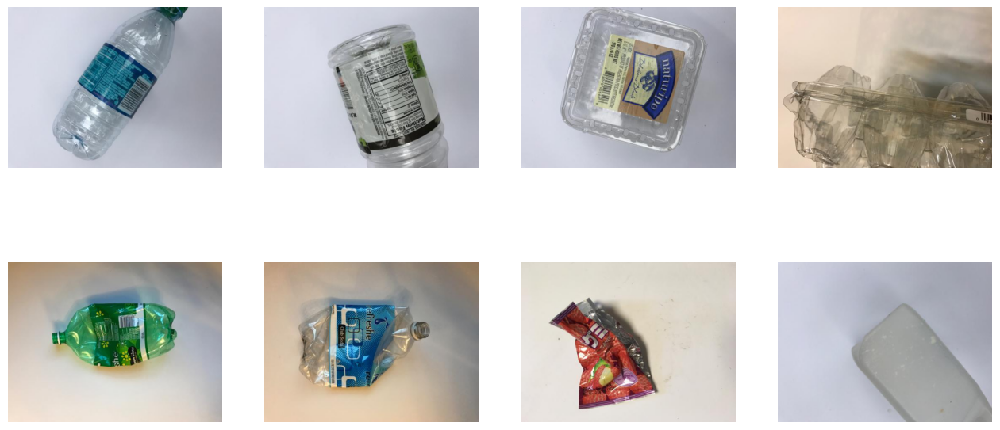

Clase: TRASH


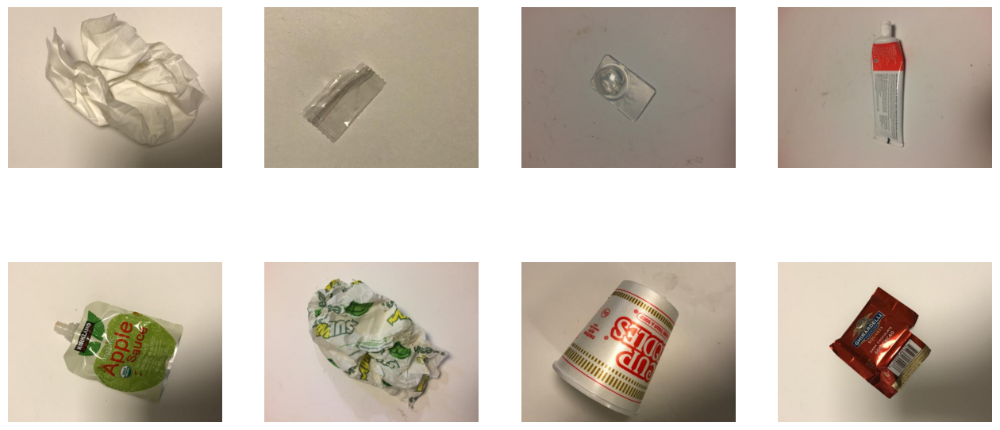

In [8]:
# Show images displayed 4x4
nrows = 4
ncols = 4
# Index for iterating over images
pic_index = 0
pic_index += 8

# Import mpimg
import matplotlib.image as mpimg
import os # Ensure os is imported

# Get the list of filenames for the 'cardboard' class
cardboard_filenames = os.listdir(base_dir + '/cardboard')
glass_filenames = os.listdir(base_dir + '/glass')
metal_filenames = os.listdir(base_dir + '/metal')
paper_filenames = os.listdir(base_dir + '/paper')
plastic_filenames = os.listdir(base_dir + '/plastic')
trash_filenames = os.listdir(base_dir + '/trash')
# Select a slice of filenames
#next_blight_pix = [os.path.join(base_dir + '/cardboard', fname)
             #     for fname in cardboard_filenames[pic_index-8:pic_index]]

def show_image_sample(pic_directory):
  fig = plt.gcf()
  fig.set_size_inches(ncols * 4, nrows * 4)
  for i, img_path in enumerate(pic_directory):
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    try:
        img = mpimg.imread(img_path)
        plt.imshow(img)
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")
        sp.text(0.5, 0.5, 'Error', ha='center', va='center', color='red') # Indicate error on subplot
  plt.show() # Show the plot after the loop

# Example usage (assuming you want to show samples from the 'cardboard' class)
print('Clase: CARDBOARD')
show_image_sample([os.path.join(base_dir + '/cardboard', fname)
                   for fname in cardboard_filenames[pic_index-8:pic_index]])
print('Clase: GLASS')
show_image_sample([os.path.join(base_dir + '/glass', fname)
                   for fname in glass_filenames[pic_index-8:pic_index]])
print('Clase: METAL')
show_image_sample([os.path.join(base_dir + '/metal', fname)
                   for fname in metal_filenames[pic_index-8:pic_index]])
print('Clase: PAPER')
show_image_sample([os.path.join(base_dir + '/paper', fname)
                   for fname in paper_filenames[pic_index-8:pic_index]])
print('Clase: PLASTIC')
show_image_sample([os.path.join(base_dir + '/plastic', fname)
                   for fname in plastic_filenames[pic_index-8:pic_index]])
print('Clase: TRASH')
show_image_sample([os.path.join(base_dir + '/trash', fname)
                   for fname in trash_filenames[pic_index-8:pic_index]])


In [9]:
# Bloque 1: Importaciones y Configuración Inicial
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd # Opcional, para manejar rutas y etiquetas si lo prefieres

# Define tus parámetros
IMAGE_WIDTH = 224 # Puedes ajustar esto
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS = 3 # RGB
BATCH_SIZE = 32 # Puedes ajustar esto
EPOCHS = 50 # Puedes ajustar esto

# Ruta al directorio principal de tu dataset (donde están las subcarpetas glass, paper, plastic)

base_dir = '/content/trashnet_images/dataset-resized'

# Directorios de las clases que usaremos
class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']
num_classes = len(class_names)

print(f"Tamaño de imagen de entrada: {IMAGE_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Número de clases: {num_classes}")
print(f"Clases: {class_names}")
print(f"Directorio base: {base_dir}")

# Verificar si el directorio base existe
if not os.path.exists(base_dir):
    print(f"ERROR: El directorio base '{base_dir}' no existe. Por favor, verifica la ruta.")
else:
    print(f"Directorio base encontrado: '{base_dir}'")
    # Verificar subdirectorios de clases
    for cls_name in class_names:
        cls_path = os.path.join(base_dir, cls_name)
        if not os.path.exists(cls_path):
            print(f"ADVERTENCIA: El subdirectorio para la clase '{cls_name}' ({cls_path}) no existe.")
        else:
            num_files = len(os.listdir(cls_path))
            print(f"Clase '{cls_name}' encontrada en '{cls_path}' con {num_files} imágenes.")

Tamaño de imagen de entrada: (224, 224)
Batch size: 32
Número de clases: 6
Clases: ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
Directorio base: /content/trashnet_images/dataset-resized
Directorio base encontrado: '/content/trashnet_images/dataset-resized'
Clase 'cardboard' encontrada en '/content/trashnet_images/dataset-resized/cardboard' con 403 imágenes.
Clase 'glass' encontrada en '/content/trashnet_images/dataset-resized/glass' con 501 imágenes.
Clase 'metal' encontrada en '/content/trashnet_images/dataset-resized/metal' con 410 imágenes.
Clase 'paper' encontrada en '/content/trashnet_images/dataset-resized/paper' con 594 imágenes.
Clase 'plastic' encontrada en '/content/trashnet_images/dataset-resized/plastic' con 482 imágenes.
Clase 'trash' encontrada en '/content/trashnet_images/dataset-resized/trash' con 137 imágenes.


In [10]:
#EDA Parte I

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 # OpenCV
from PIL import Image # Pillow
from skimage.metrics import structural_similarity as ssim # Para comparar similitud, opcional
import os
from tqdm import tqdm # Para barras de progreso

# --- 1. Recopilación Exhaustiva de Metadatos de Imágenes ---
print("Paso 1: Recopilando metadatos de las imágenes...")

image_data = []
supported_formats = ('.png', '.jpg', '.jpeg')

if not os.path.exists(base_dir):
    print(f"ERROR: El directorio base '{base_dir}' no existe. Verifica la ruta.")
else:
    for class_name in class_names:
        class_path = os.path.join(base_dir, class_name)
        if not os.path.exists(class_path):
            print(f"ADVERTENCIA: El subdirectorio para la clase '{class_name}' ({class_path}) no existe.")
            continue

        for img_name in tqdm(os.listdir(class_path), desc=f"Procesando clase: {class_name}"):
            if img_name.lower().endswith(supported_formats):
                img_path = os.path.join(class_path, img_name)
                try:
                    # Usar Pillow para metadatos generales y OpenCV para otros análisis
                    pil_img = Image.open(img_path)
                    cv_img = cv2.imread(img_path)

                    width, height = pil_img.size
                    aspect_ratio = width / height if height > 0 else 0
                    channels = len(pil_img.getbands())
                    mode = pil_img.mode # Ej: 'RGB', 'L' (escala de grises)

                    # Brillo promedio (convertir a escala de grises si es necesario)
                    if cv_img is not None:
                        gray_img = cv2.cvtColor(cv_img, cv2.COLOR_BGR2GRAY) if channels == 3 else cv_img
                        avg_brightness = np.mean(gray_img)
                    else: # Fallback si OpenCV no puede leerla pero Pillow sí
                        gray_pil_img = pil_img.convert('L')
                        avg_brightness = np.mean(np.array(gray_pil_img))


                    image_data.append({
                        'path': img_path,
                        'filename': img_name,
                        'class': class_name,
                        'width': width,
                        'height': height,
                        'aspect_ratio': aspect_ratio,
                        'channels': channels,
                        'mode': mode,
                        'avg_brightness': avg_brightness,
                        'filesize_kb': os.path.getsize(img_path) / 1024
                    })
                except Exception as e:
                    print(f"Error procesando imagen {img_path}: {e}")

    df_images = pd.DataFrame(image_data)
    if not df_images.empty:
        print(f"\nMetadatos recopilados para {len(df_images)} imágenes.")
        print(df_images.head())
        print("\nInformación general del DataFrame de metadatos:")
        df_images.info()
        print("\nEstadísticas descriptivas de los metadatos numéricos:")
        print(df_images.describe())
    else:
        print("No se pudieron recopilar metadatos. Verifica los directorios y formatos de imagen.")

Paso 1: Recopilando metadatos de las imágenes...


Procesando clase: trash: 100%|██████████| 137/137 [00:00<00:00, 661.31it/s]


Metadatos recopilados para 2527 imágenes.
                                                path          filename  \
0  /content/trashnet_images/dataset-resized/cardb...   cardboard38.jpg   
1  /content/trashnet_images/dataset-resized/cardb...  cardboard185.jpg   
2  /content/trashnet_images/dataset-resized/cardb...  cardboard267.jpg   
3  /content/trashnet_images/dataset-resized/cardb...  cardboard235.jpg   
4  /content/trashnet_images/dataset-resized/cardb...  cardboard151.jpg   

       class  width  height  aspect_ratio  channels mode  avg_brightness  \
0  cardboard    512     384      1.333333         3  RGB      159.646795   
1  cardboard    512     384      1.333333         3  RGB      162.414342   
2  cardboard    512     384      1.333333         3  RGB      160.724650   
3  cardboard    512     384      1.333333         3  RGB      153.742416   
4  cardboard    512     384      1.333333         3  RGB      188.483821   

   filesize_kb  
0    21.590820  
1    13.404297  
2   


--- Paso 2: Análisis de Distribución de Clases ---


/tmp/ipython-input-11-3650264844.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')


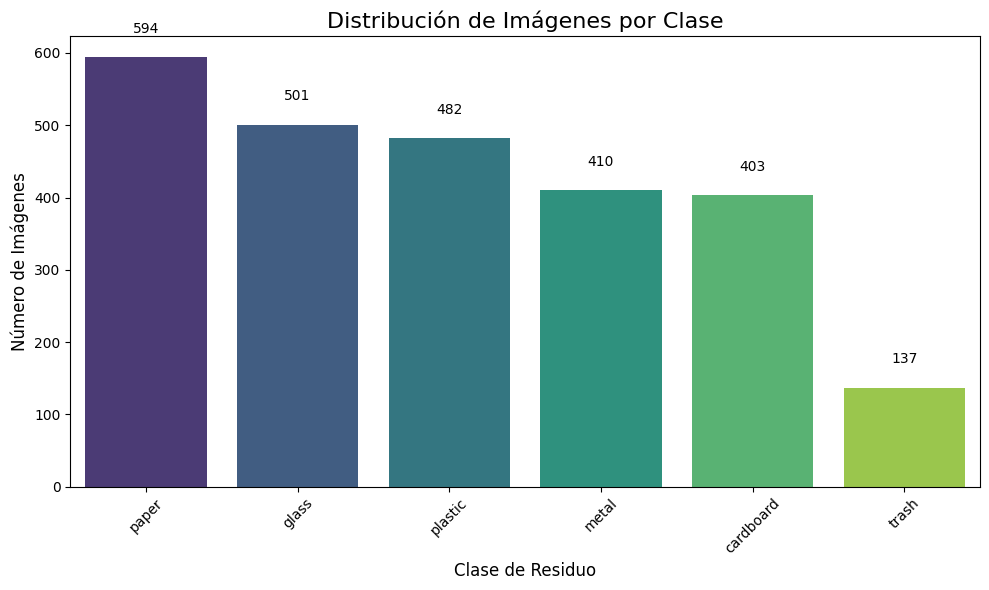


Conclusiones de la Distribución de Clases:
Se observa un desbalance significativo entre clases.
Podriamos usar las siguientes técnicas para arreglarlo:
  - Data Augmentation selectivo por clase.
  - Uso de pesos de clase ('class_weights') durante el entrenamiento.
  - Sobremuestreo de clases minoritarias.
  - Submuestreo de clases mayoritarias.


In [11]:
# --- 2. Análisis Detallado de la Distribución de Clases ---
if not df_images.empty:
    print("\n--- Paso 2: Análisis de Distribución de Clases ---")
    class_counts = df_images['class'].value_counts()

    plt.figure(figsize=(10, 6))
    sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
    plt.title('Distribución de Imágenes por Clase', fontsize=16)
    plt.xlabel('Clase de Residuo', fontsize=12)
    plt.ylabel('Número de Imágenes', fontsize=12)
    plt.xticks(rotation=45)
    for i, count in enumerate(class_counts.values):
        plt.text(i, count + 0.05 * max(class_counts.values), str(count), ha='center', va='bottom', fontsize=10)
    plt.tight_layout()
    plt.show()

    print("\nConclusiones de la Distribución de Clases:")
    if len(class_counts) > 0:
        if class_counts.min() / class_counts.max() < 0.5: # Ejemplo de umbral para desbalance
            print("Se observa un desbalance significativo entre clases.")
            print("Podriamos usar las siguientes técnicas para arreglarlo:")
            print("  - Data Augmentation selectivo por clase.")
            print("  - Uso de pesos de clase ('class_weights') durante el entrenamiento.")
            print("  - Sobremuestreo de clases minoritarias.")
            print("  - Submuestreo de clases mayoritarias.")
        else:
            print("La distribución de clases parece relativamente balanceada.")
    else:
        print("No hay datos de clases para analizar.")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 2.")


--- Paso 3: Visualización Avanzada de Muestras ---


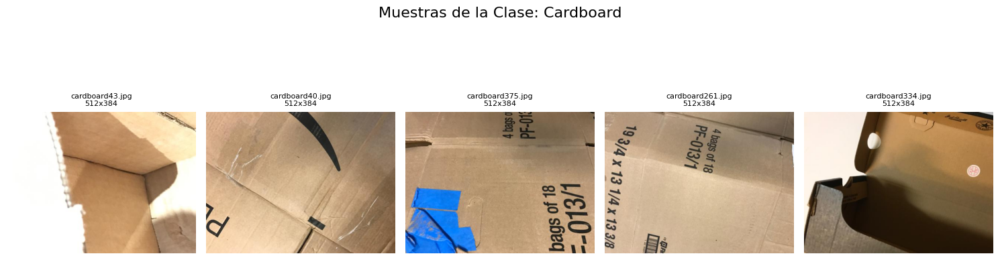

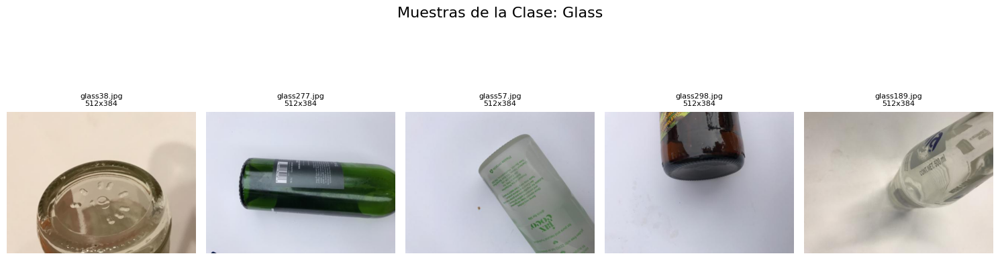

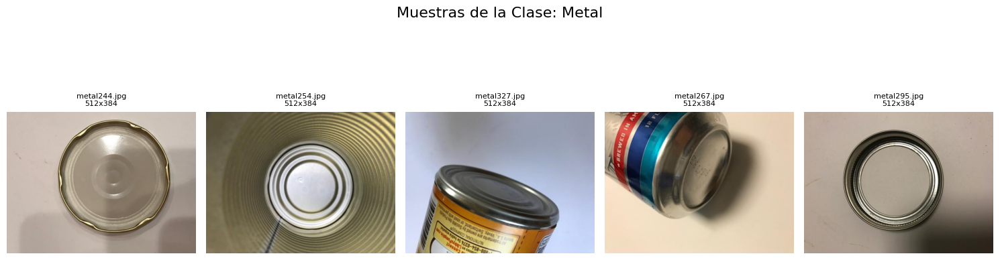

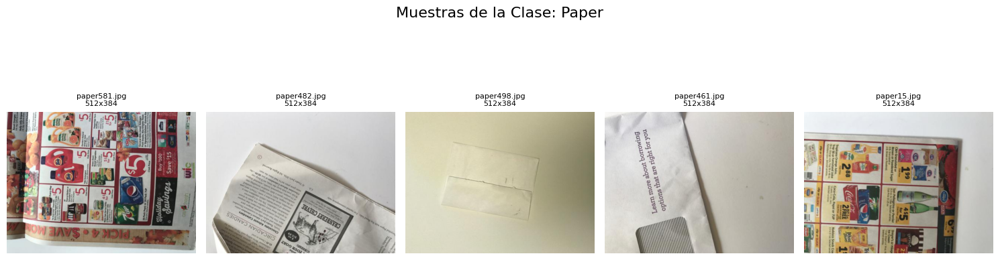

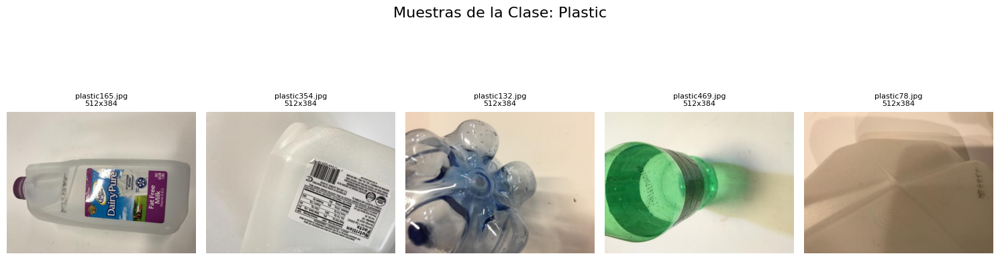

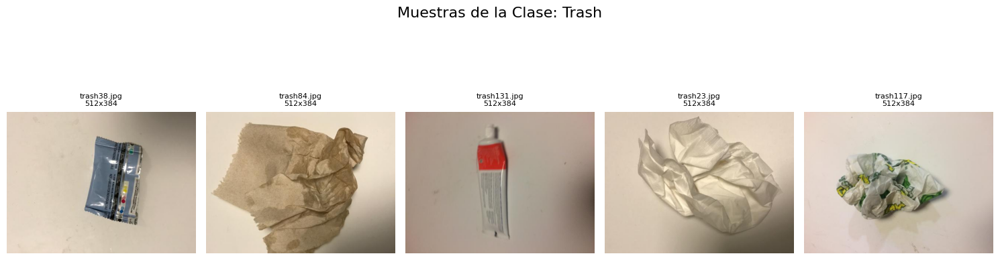


Observaciones durante la visualización de muestras:
- Variabilidad Intra-clase: ¿Cuán diferentes son las imágenes dentro de la misma clase (formas, colores, texturas, ángulos)?
- Similitud Inter-clase: ¿Hay imágenes de diferentes clases que se parecen mucho? (Ej. plástico transparente vs. vidrio)
- Calidad de imagen: ¿Son nítidas, borrosas, bien iluminadas?
- Oclusiones y Ruido: ¿Presencia de manos, otros objetos, fondos complejos?


In [12]:
# --- 3. Visualización Avanzada de Muestras de Imágenes ---
if not df_images.empty:
    print("\n--- Paso 3: Visualización Avanzada de Muestras ---")
    num_samples_to_show_per_class = 5

    for class_name in class_names:
        plt.figure(figsize=(15, 5))
        plt.suptitle(f'Muestras de la Clase: {class_name.capitalize()}', fontsize=16)
        class_df = df_images[df_images['class'] == class_name]

        if not class_df.empty:
            sample_images = class_df.sample(min(num_samples_to_show_per_class, len(class_df)))
            for i, (_, row) in enumerate(sample_images.iterrows()):
                plt.subplot(1, num_samples_to_show_per_class, i + 1)
                try:
                    img = Image.open(row['path'])
                    plt.imshow(img)
                    plt.title(f"{row['filename']}\n{row['width']}x{row['height']}", fontsize=8)
                    plt.axis('off')
                except Exception as e:
                    print(f"Error al mostrar imagen {row['path']}: {e}")
                    plt.text(0.5, 0.5, 'Error', ha='center', va='center')
                    plt.axis('off')
        else:
            print(f"No hay imágenes para la clase '{class_name}' para mostrar.")
            plt.text(0.5, 0.5, f'No hay imágenes para {class_name}', ha='center', va='center')
            plt.axis('off')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajustar para suptitle
        plt.show()

    print("\nObservaciones durante la visualización de muestras:")
    print("- Variabilidad Intra-clase: ¿Cuán diferentes son las imágenes dentro de la misma clase (formas, colores, texturas, ángulos)?")
    print("- Similitud Inter-clase: ¿Hay imágenes de diferentes clases que se parecen mucho? (Ej. plástico transparente vs. vidrio)")
    print("- Calidad de imagen: ¿Son nítidas, borrosas, bien iluminadas?")
    print("- Oclusiones y Ruido: ¿Presencia de manos, otros objetos, fondos complejos?")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 3.")

1. Variabilidad Intra-clase:

¿Cuán diferentes son las imágenes dentro de la misma clase?

Basado en las imágenes mostradas, hay una variabilidad significativa dentro de cada clase:

*   Plastic: Se observan diferentes tipos de plásticos - envases transparentes,botellas verdes, envases blancos, etc.... Tienen diferentes formas, transparencias y texturas.
*   Trash: La variabilidad es alta, con diferentes objetos como bandejas de plástico, botellas aplastadas, y envases transparentes.
*   Papel y otros: También presentan variabilidad en colores, formas y texturas.

Esta alta variabilidad intra-clase es la que nos puede afectar durante el desarrollo de el modelo, ya que tiene que aprender características comunes que identifiquen una clase a pesar de estas diferencias.

2. Similitud Inter-clase:

¿Hay imágenes de diferentes clases que se parecen mucho?

Sí, existen similitudes entre algunas clases:

*   Plástico transparente vs. Vidrio: Ambos pueden tener apariencia similar, transparente y brillante.
*   Plástico blanco vs. Papel: Algunas bolsas de plástico blanco pueden confundirse con papel desde ciertos ángulos.
*   Bandejas de plástico vs. bandejas de cartón: Su forma puede ser similar aunque el material sea distinto.

Estas similitudes representan otro desafío para el modelo, ya que necesitariamos que aprendiera a distinguir sutiles diferencias en textura y reflejo de luz para diferenciar materiales similares.

3. Calidad de imagen:

Las imágenes mostradas tienen:

*   Buena nitidez: La mayoría son nítidas y se pueden distinguir detalles
Iluminación variable: Algunas tienen buena iluminación mientras que otras presentan sombras o reflejos
*   Fondos consistentes: Casi todas tienen un fondo blanco/gris uniforme, lo que es positivo
*   Ángulos diversos: Los objetos están fotografiados desde diferentes ángulos y posiciones


--- Paso 4: Análisis de Dimensiones y Relaciones de Aspecto ---


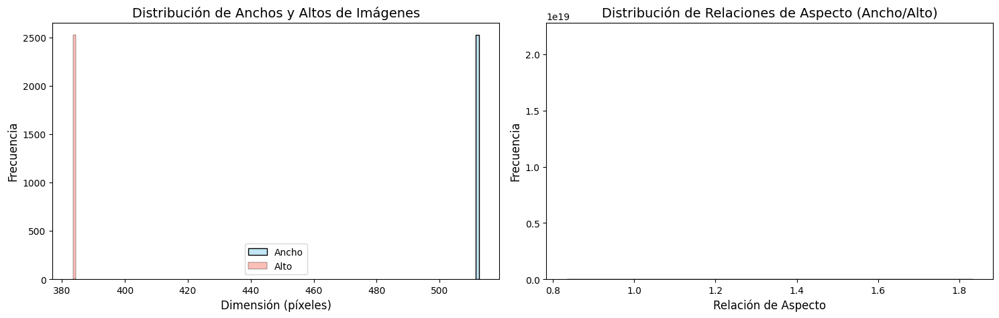

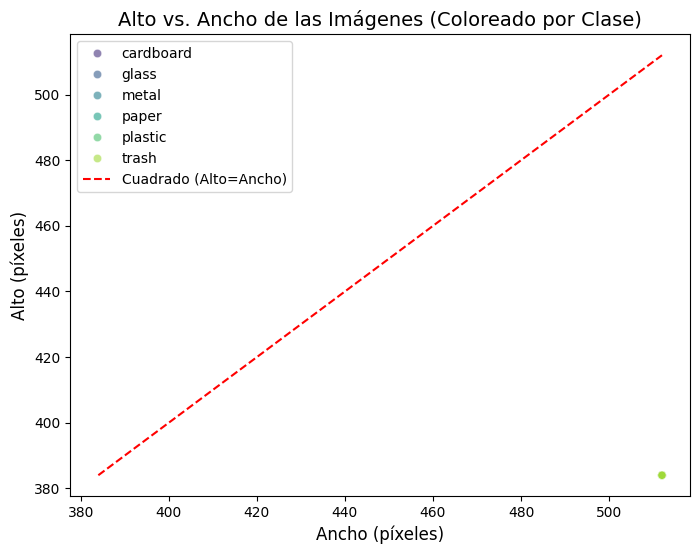


Conclusiones sobre Dimensiones:
Rango de Ancho: 512 - 512 px
Rango de Alto: 384 - 384 px
Rango de Relación de Aspecto: 1.33 - 1.33
- La mayoría de los modelos CNN requieren un tamaño de entrada fijo.
- Si hay mucha variabilidad, el redimensionamiento es crucial. Considerar:
  - Redimensionamiento directo (puede distorsionar).
  - Redimensionamiento con mantenimiento de relación de aspecto + padding.
- Tamaño objetivo predefinido para el modelo: (224, 224) (revisar si es adecuado).


In [13]:
# --- 4. Análisis Profundo de Dimensiones y Relaciones de Aspecto ---
if not df_images.empty:
    print("\n--- Paso 4: Análisis de Dimensiones y Relaciones de Aspecto ---")

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(df_images['width'], kde=True, color='skyblue', label='Ancho')
    sns.histplot(df_images['height'], kde=True, color='salmon', label='Alto')
    plt.title('Distribución de Anchos y Altos de Imágenes', fontsize=14)
    plt.xlabel('Dimensión (píxeles)', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.legend()

    plt.subplot(1, 2, 2)
    sns.histplot(df_images['aspect_ratio'], kde=True, color='lightgreen')
    plt.title('Distribución de Relaciones de Aspecto (Ancho/Alto)', fontsize=14)
    plt.xlabel('Relación de Aspecto', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df_images, x='width', y='height', hue='class', alpha=0.6, palette='viridis')
    plt.title('Alto vs. Ancho de las Imágenes (Coloreado por Clase)', fontsize=14)
    plt.xlabel('Ancho (píxeles)', fontsize=12)
    plt.ylabel('Alto (píxeles)', fontsize=12)
    # Línea para imágenes cuadradas
    min_dim = min(df_images['width'].min(), df_images['height'].min())
    max_dim = max(df_images['width'].max(), df_images['height'].max())
    plt.plot([min_dim, max_dim], [min_dim, max_dim], 'r--', label='Cuadrado (Alto=Ancho)')
    plt.legend()
    plt.show()

    print("\nConclusiones sobre Dimensiones:")
    print(f"Rango de Ancho: {df_images['width'].min()} - {df_images['width'].max()} px")
    print(f"Rango de Alto: {df_images['height'].min()} - {df_images['height'].max()} px")
    print(f"Rango de Relación de Aspecto: {df_images['aspect_ratio'].min():.2f} - {df_images['aspect_ratio'].max():.2f}")
    print("- La mayoría de los modelos CNN requieren un tamaño de entrada fijo.")
    print("- Si hay mucha variabilidad, el redimensionamiento es crucial. Considerar:")
    print("  - Redimensionamiento directo (puede distorsionar).")
    print("  - Redimensionamiento con mantenimiento de relación de aspecto + padding.")
    print(f"- Tamaño objetivo predefinido para el modelo: {IMAGE_SIZE} (revisar si es adecuado).")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 4.")


#--# Redimensionamiento optimizado:
#Si se requiere un tamaño diferente para el modelo (por razones de eficiencia), considerar mantener la relación de aspecto 4:3
#Tamaños recomendados que conservan la relación 4:3: 224x168, 256x192, 384x288, 448x336

Análisis:

1. Dimensiones uniformes:

El gráfico muestra que casi todas las imágenes tienen dimensiones idénticas (cerca de 512 x 384 píxeles)
Hay muy poca variabilidad en las dimensiones


2. Relación de aspecto constante:

La mayoría de las imágenes tiene una relación de aspecto entre 1.33 - 1.33 (4:3)
Esta uniformidad podria sugerir que las imágenes fueron capturadas con la misma cámara/configuración



Dado que las imágenes ya tienen dimensiones consistentes, creemos que no es necesario un preprocesamiento de las dimensiones. Podriamos utilizar directamente el tamaño 512x384 para el modelo, lo cual conservaría todos los detalles originales.



--- Paso 5: Análisis de Canales de Color e Intensidad ---
Modos de imagen encontrados:
mode
RGB    2527
Name: count, dtype: int64
Número de canales encontrados:
channels
3    2527
Name: count, dtype: int64

Histogramas de Color para la clase: cardboard


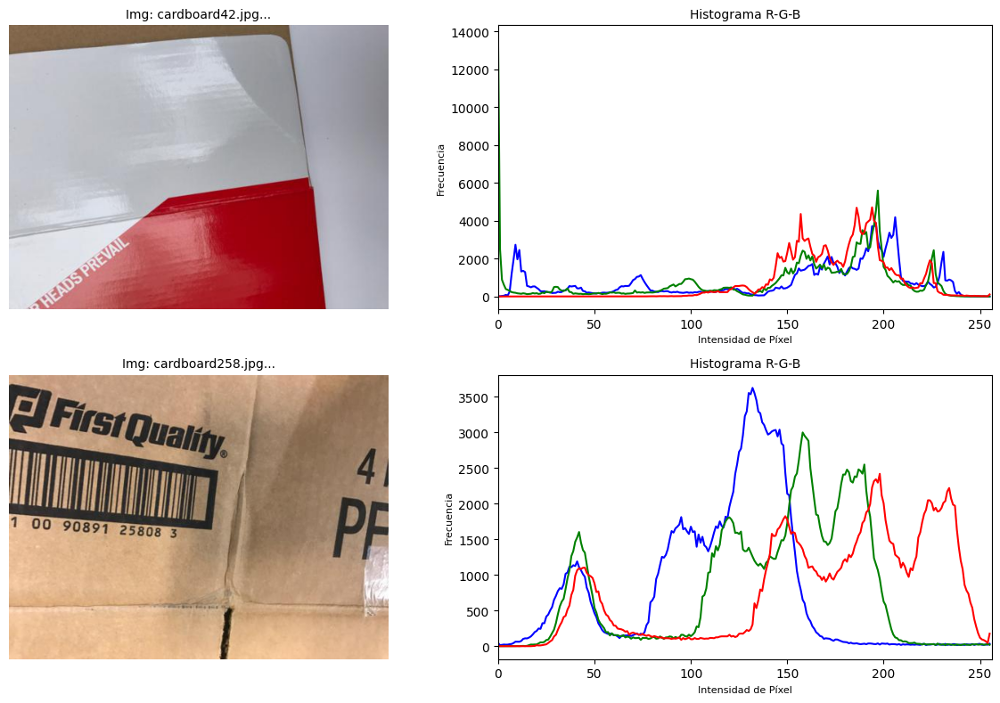


Histogramas de Color para la clase: glass


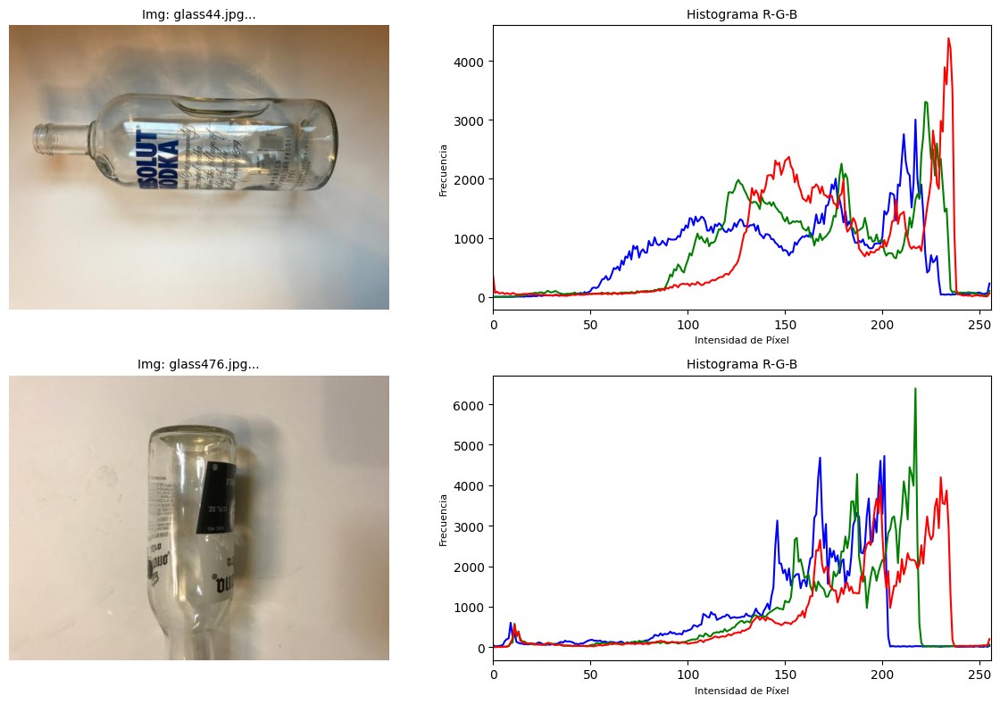


Histogramas de Color para la clase: metal


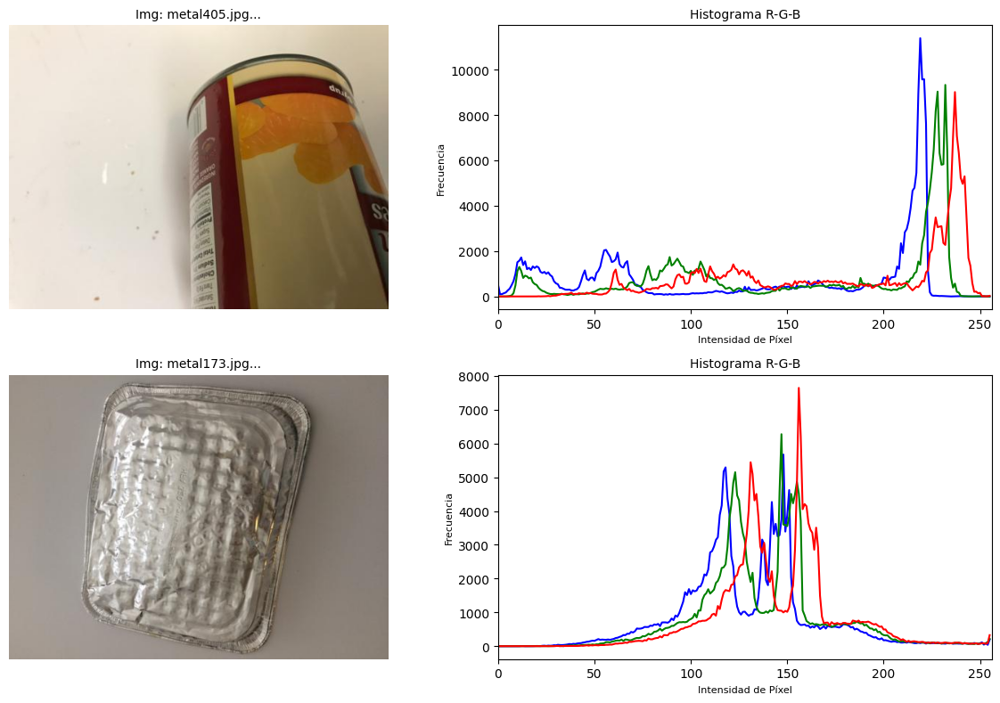


Histogramas de Color para la clase: paper


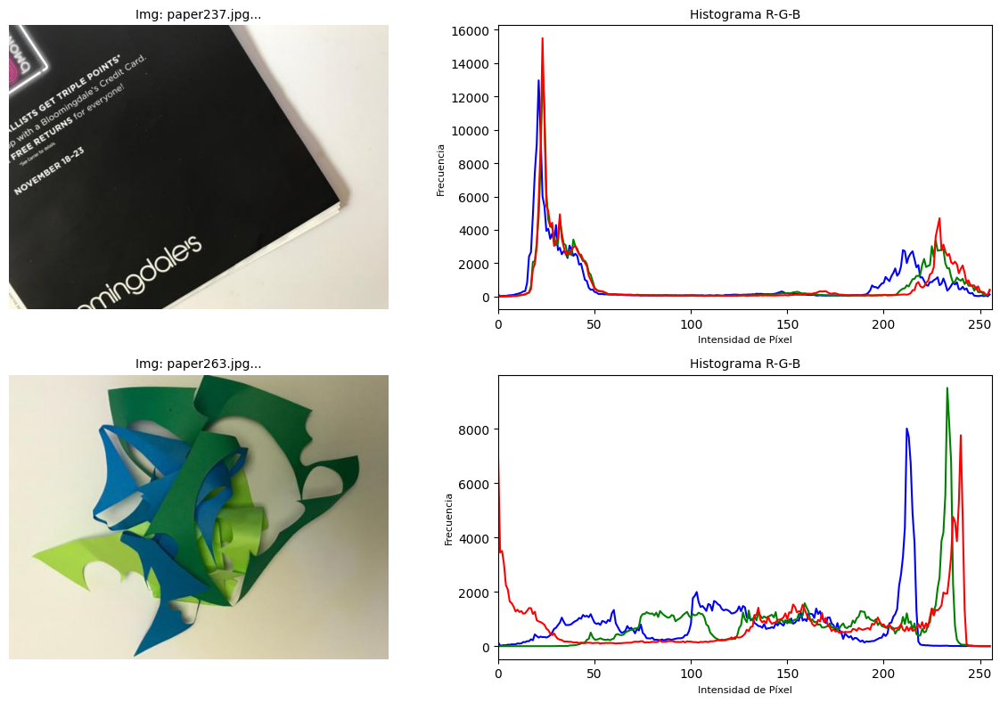


Histogramas de Color para la clase: plastic


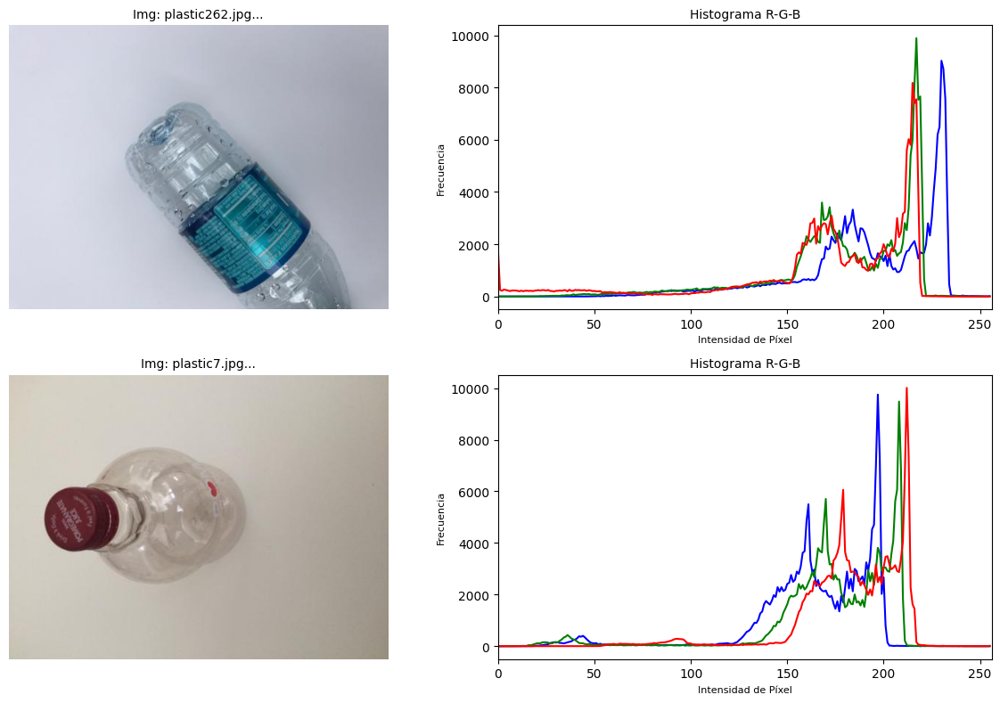


Histogramas de Color para la clase: trash


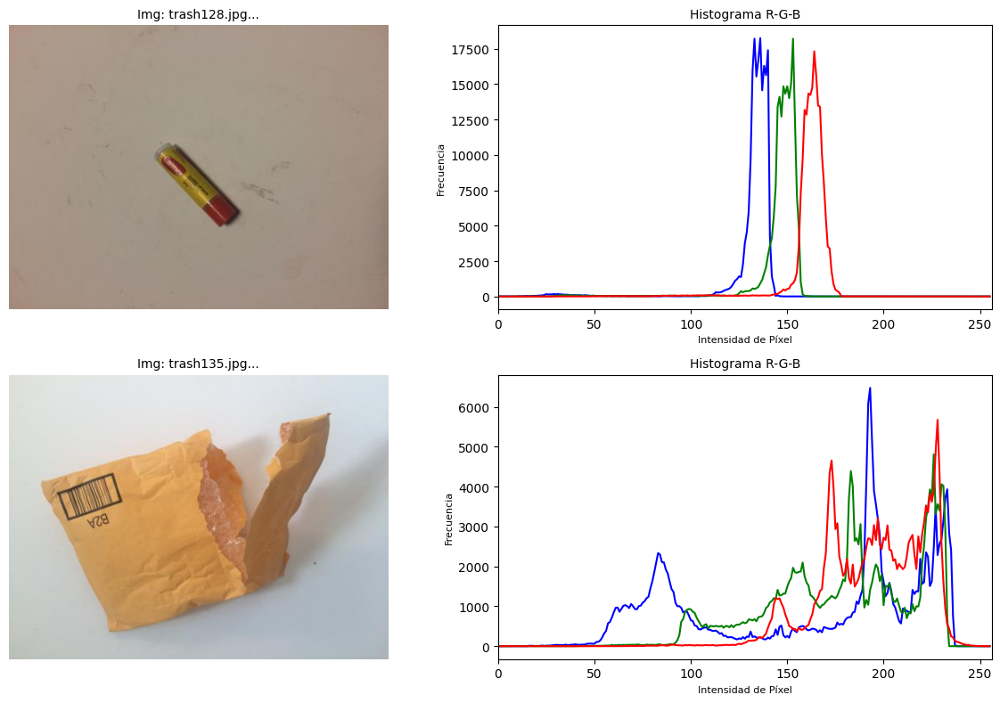


Conclusiones sobre Color:
- El color parece ser una característica distintiva importante para los residuos (ej. vidrio verde/marrón, ciertos plásticos).
- Asegurar que todas las imágenes se procesen con 3 canales (RGB) para modelos estándar.
- Las distribuciones de intensidad pueden revelar si las imágenes son consistentemente brillantes/oscuras en ciertos canales.


In [14]:
# --- 5. Análisis Detallado de Canales de Color e Intensidad ---
if not df_images.empty:
    print("\n--- Paso 5: Análisis de Canales de Color e Intensidad ---")

    print("Modos de imagen encontrados:")
    print(df_images['mode'].value_counts())
    print("Número de canales encontrados:")
    print(df_images['channels'].value_counts())

    if not (df_images['mode'] == 'RGB').all() or not (df_images['channels'] == 3).all():
        print("ADVERTENCIA: No todas las imágenes son RGB de 3 canales. Se necesitará conversión o manejo especial.")
        # Ejemplo de cómo convertir (no se ejecuta aquí, solo informativo):
        # img_pil = Image.open(path).convert('RGB')

    # Mostrar histogramas de color para algunas imágenes de muestra por clase
    num_samples_hist_color = 2
    for class_name in class_names:
        print(f"\nHistogramas de Color para la clase: {class_name}")
        class_df = df_images[df_images['class'] == class_name]
        if not class_df.empty:
            sample_images_color = class_df.sample(min(num_samples_hist_color, len(class_df)))
            plt.figure(figsize=(12, num_samples_hist_color * 4))
            for i, (_, row) in enumerate(sample_images_color.iterrows()):
                try:
                    cv_img = cv2.imread(row['path'])
                    if cv_img is not None:
                        plt.subplot(num_samples_hist_color, 2, i * 2 + 1)
                        plt.imshow(cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB))
                        plt.title(f"Img: {row['filename'][:20]}...", fontsize=10)
                        plt.axis('off')

                        plt.subplot(num_samples_hist_color, 2, i * 2 + 2)
                        colors = ('b', 'g', 'r') # OpenCV lee en BGR
                        for channel_idx, color in enumerate(colors):
                            hist = cv2.calcHist([cv_img], [channel_idx], None, [256], [0, 256])
                            plt.plot(hist, color=color)
                        plt.title('Histograma R-G-B', fontsize=10)
                        plt.xlabel('Intensidad de Píxel', fontsize=8)
                        plt.ylabel('Frecuencia', fontsize=8)
                        plt.xlim([0, 256])
                    else:
                         print(f"No se pudo leer {row['path']} con OpenCV para histograma.")
                except Exception as e:
                    print(f"Error al generar histograma para {row['path']}: {e}")
            plt.tight_layout()
            plt.show()

    print("\nConclusiones sobre Color:")
    print("- El color parece ser una característica distintiva importante para los residuos (ej. vidrio verde/marrón, ciertos plásticos).")
    print("- Asegurar que todas las imágenes se procesen con 3 canales (RGB) para modelos estándar.")
    print("- Las distribuciones de intensidad pueden revelar si las imágenes son consistentemente brillantes/oscuras en ciertos canales.")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 5.")

In [17]:
# Código para análisis y extracción de características de color en el dataset TrashNet

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from tqdm import tqdm
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.efficientnet import preprocess_input
import joblib
import seaborn as sns
import random
from skimage.feature import graycomatrix, graycoprops

# Definir nombres de clases
class_names = ['paper', 'glass', 'plastic', 'metal', 'cardboard', 'trash']

def analizar_estadisticas_color(dataset_path, sample_size=None):
    """
    Analiza estadísticas de color detalladas para cada clase en el dataset.

    Args:
        dataset_path: Ruta al dataset
        sample_size: Tamaño de muestra por clase (None para usar todas)

    Returns:
        DataFrame con estadísticas de color por imagen
    """
    print("Analizando estadísticas de color por clase...")

    # Lista para almacenar resultados
    resultados = []

    # Procesar cada clase
    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Tomar muestra si se especifica
        if sample_size is not None and sample_size < len(imagenes):
            random.seed(42)  # Para reproducibilidad
            imagenes = random.sample(imagenes, sample_size)

        print(f"Procesando {len(imagenes)} imágenes de la clase '{class_name}'...")

        # Procesar cada imagen
        for img_name in tqdm(imagenes):
            img_path = os.path.join(class_path, img_name)

            # Leer imagen con OpenCV (BGR)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Convertir a RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Obtener canales
            r_channel = img_rgb[:,:,0]
            g_channel = img_rgb[:,:,1]
            b_channel = img_rgb[:,:,2]

            # Convertir a HSV for additional analysis
            img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            h_channel = img_hsv[:,:,0]
            s_channel = img_hsv[:,:,1]
            v_channel = img_hsv[:,:,2]

            # Calcular histogramas
            hist_r = cv2.calcHist([r_channel], [0], None, [256], [0, 256])
            hist_g = cv2.calcHist([g_channel], [0], None, [256], [0, 256])
            hist_b = cv2.calcHist([b_channel], [0], None, [256], [0, 256])
            hist_h = cv2.calcHist([h_channel], [0], None, [180], [0, 180])
            hist_s = cv2.calcHist([s_channel], [0], None, [256], [0, 256])
            hist_v = cv2.calcHist([v_channel], [0], None, [256], [0, 256])

            # Normalize histograms
            area = img_rgb.shape[0] * img_rgb.shape[1]
            hist_r = hist_r / area
            hist_g = hist_g / area
            hist_b = hist_b / area
            hist_h = hist_h / area
            hist_s = hist_s / area
            hist_v = hist_v / area

            # Extract color features
            # 1. Basic statistics by channel
            stats_r = {
                'r_mean': np.mean(r_channel),
                'r_std': np.std(r_channel),
                'r_median': np.median(r_channel),
                'r_min': np.min(r_channel),
                'r_max': np.max(r_channel),
                'r_q1': np.percentile(r_channel, 25),
                'r_q3': np.percentile(r_channel, 75),
            }

            stats_g = {
                'g_mean': np.mean(g_channel),
                'g_std': np.std(g_channel),
                'g_median': np.median(g_channel),
                'g_min': np.min(g_channel),
                'g_max': np.max(g_channel),
                'g_q1': np.percentile(g_channel, 25),
                'g_q3': np.percentile(g_channel, 75),
            }

            stats_b = {
                'b_mean': np.mean(b_channel),
                'b_std': np.std(b_channel),
                'b_median': np.median(b_channel),
                'b_min': np.min(b_channel),
                'b_max': np.max(b_channel),
                'b_q1': np.percentile(b_channel, 25),
                'b_q3': np.percentile(b_channel, 75),
            }

            # 2. HSV space statistics
            stats_hsv = {
                'h_mean': np.mean(h_channel),
                'h_std': np.std(h_channel),
                's_mean': np.mean(s_channel),
                's_std': np.std(s_channel),
                'v_mean': np.mean(v_channel),
                'v_std': np.std(v_channel),
            }

            # 3. Advanced features
            # Ratios between channels
            stats_relaciones = {
                'r_g_ratio': np.mean(r_channel) / (np.mean(g_channel) + 1e-6),
                'r_b_ratio': np.mean(r_channel) / (np.mean(b_channel) + 1e-6),
                'g_b_ratio': np.mean(g_channel) / (np.mean(b_channel) + 1e-6),
                'brightness': (np.mean(r_channel) + np.mean(g_channel) + np.mean(b_channel)) / 3,
                'saturation': np.mean(s_channel),
            }

            # 4. Histogram peak analysis
            # Find significant peaks in histograms
            def encontrar_picos(hist, umbral_pico=0.005):
                picos = []
                for i in range(1, len(hist)-1):
                    if hist[i] > hist[i-1] and hist[i] > hist[i+1] and hist[i] > umbral_pico:
                        picos.append((i, hist[i][0]))
                return sorted(picos, key=lambda x: x[1], reverse=True)[:3]  # Top 3 picos

            picos_r = encontrar_picos(hist_r)
            picos_g = encontrar_picos(hist_g)
            picos_b = encontrar_picos(hist_b)
            picos_h = encontrar_picos(hist_h)

            # Extract positions of main peaks
            stats_picos = {}
            for i, (pos, val) in enumerate(picos_r[:min(3, len(picos_r))]):
                stats_picos[f'r_peak{i+1}_pos'] = pos
                stats_picos[f'r_peak{i+1}_val'] = val

            for i, (pos, val) in enumerate(picos_g[:min(3, len(picos_g))]):
                stats_picos[f'g_peak{i+1}_pos'] = pos
                stats_picos[f'g_peak{i+1}_val'] = val

            for i, (pos, val) in enumerate(picos_b[:min(3, len(picos_b))]):
                stats_picos[f'b_peak{i+1}_pos'] = pos
                stats_picos[f'b_peak{i+1}_val'] = val

            for i, (pos, val) in enumerate(picos_h[:min(3, len(picos_h))]):
                stats_picos[f'h_peak{i+1}_pos'] = pos
                stats_picos[f'h_peak{i+1}_val'] = val

            # 5. Color-based texture analysis
            # Calculate co-occurrence matrices for texture

            # Convert to grayscale for texture analysis
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # Reduce gray levels for more efficient co-occurrence matrices
            gray_scaled = (gray / 32).astype(np.uint8)

            # Calculate co-occurrence matrix
            try:
                glcm = graycomatrix(gray_scaled, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], levels=8, symmetric=True, normed=True)

                # Extract properties
                stats_textura = {
                    'contrast': np.mean(graycoprops(glcm, 'contrast')),
                    'dissimilarity': np.mean(graycoprops(glcm, 'dissimilarity')),
                    'homogeneity': np.mean(graycoprops(glcm, 'homogeneity')),
                    'energy': np.mean(graycoprops(glcm, 'energy')),
                    'correlation': np.mean(graycoprops(glcm, 'correlation')),
                }
            except Exception as e:
                print(f"Error en análisis de textura para {img_path}: {e}")
                stats_textura = {
                    'contrast': 0,
                    'dissimilarity': 0,
                    'homogeneity': 0,
                    'energy': 0,
                    'correlation': 0,
                }

            # Combine all statistics
            stats_imagen = {
                'filename': img_name,
                'class': class_name,
                'class_id': class_idx,
                'width': img.shape[1],
                'height': img.shape[0],
                'aspect_ratio': img.shape[1] / img.shape[0],
            }

            # Add all statistics
            stats_imagen.update(stats_r)
            stats_imagen.update(stats_g)
            stats_imagen.update(stats_b)
            stats_imagen.update(stats_hsv)
            stats_imagen.update(stats_relaciones)
            stats_imagen.update(stats_picos)
            stats_imagen.update(stats_textura)

            # Add to results list
            resultados.append(stats_imagen)

    # Create DataFrame
    df_stats = pd.DataFrame(resultados)

    # Save results
    df_stats.to_csv('estadisticas_color_trashnet.csv', index=False)

    print(f"Análisis completado. Se procesaron {len(df_stats)} imágenes.")
    print(f"Resultados guardados en 'estadisticas_color_trashnet.csv'")

    return df_stats

def visualizar_distribucion_color_por_clase(df_stats):
    """
    Visualiza the distribution of color features by class.

    Args:
        df_stats: DataFrame with color statistics
    """
    print("Generando visualizaciones de distribución de color por clase...")

    # Important features to analyze
    caracteristicas = [
        'r_mean', 'g_mean', 'b_mean',
        'h_mean', 's_mean', 'v_mean',
        'brightness', 'saturation',
        'contrast', 'homogeneity'
    ]

    # Create distribution plots
    for feature in caracteristicas:
        plt.figure(figsize=(12, 8))

        for class_name in class_names:
            # Filter by class
            class_data = df_stats[df_stats['class'] == class_name][feature]

            # Plot distribution
            plt.hist(class_data, alpha=0.5, label=class_name, bins=30)

        plt.title(f'Distribución de {feature} por Clase')
        plt.xlabel(feature)
        plt.ylabel('Frecuencia')
        plt.legend()
        plt.tight_layout()
        plt.savefig(f'distribucion_{feature}_por_clase.png')
        plt.close()

    # RGB channel relationship by class
    plt.figure(figsize=(12, 8))
    for class_name in class_names:
        class_data = df_stats[df_stats['class'] == class_name]
        plt.scatter(class_data['r_mean'], class_data['g_mean'], alpha=0.5, label=class_name)

    plt.title('Relación entre Canales R y G por Clase')
    plt.xlabel('Media Canal R')
    plt.ylabel('Media Canal G')
    plt.legend()
    plt.tight_layout()
    plt.savefig('relacion_r_g_por_clase.png')
    plt.close()

    # Saturation and brightness relationship by class
    plt.figure(figsize=(12, 8))
    for class_name in class_names:
        class_data = df_stats[df_stats['class'] == class_name]
        plt.scatter(class_data['saturation'], class_data['brightness'], alpha=0.5, label=class_name)

    plt.title('Relación entre Saturación y Brillo por Clase')
    plt.xlabel('Saturación')
    plt.ylabel('Brillo')
    plt.legend()
    plt.tight_layout()
    plt.savefig('relacion_saturacion_brillo_por_clase.png')
    plt.close()

    print("Visualizaciones guardadas como archivos PNG.")

def crear_histogramas_color_por_clase(dataset_path, num_muestras=3):
    """
    Crea color histograms for representative samples of each class.

    Args:
        dataset_path: Ruta al dataset
        num_muestras: Número de imágenes de muestra por clase
    """
    print("Creando histogramas de color por clase...")

    plt.figure(figsize=(15, len(class_names) * 4))
    plot_idx = 1

    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # List image files
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Take random samples
        random.seed(42)  # For reproducibility
        if len(imagenes) > num_muestras:
            muestras = random.sample(imagenes, num_muestras)
        else:
            muestras = imagenes

        # Process each sample
        for img_name in muestras:
            img_path = os.path.join(class_path, img_name)

            # Read image with OpenCV (BGR)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Convert to RGB for visualization
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Get channels
            r_channel = img_rgb[:,:,0]
            g_channel = img_rgb[:,:,1]
            b_channel = img_rgb[:,:,2]

            # Calculate histograms
            hist_r = cv2.calcHist([r_channel], [0], None, [256], [0, 256])
            hist_g = cv2.calcHist([g_channel], [0], None, [256], [0, 256])
            hist_b = cv2.calcHist([b_channel], [0], None, [256], [0, 256])

            # Normalize histograms
            hist_r = hist_r / (np.sum(hist_r) + 1e-7) * 100
            hist_g = hist_g / (np.sum(hist_g) + 1e-7) * 100
            hist_b = hist_b / (np.sum(hist_b) + 1e-7) * 100

            # Show image
            plt.subplot(len(class_names) * num_muestras, 2, plot_idx)
            plt.imshow(img_rgb)
            plt.title(f"{class_name}: {img_name[:10]}...", fontsize=8)
            plt.axis('off')

            # Show histograms
            plt.subplot(len(class_names) * num_muestras, 2, plot_idx + 1)
            plt.plot(hist_r, color='red', label='R')
            plt.plot(hist_g, color='green', label='G')
            plt.plot(hist_b, color='blue', label='B')
            plt.title('Histograma RGB', fontsize=8)
            plt.xlabel('Pixel Intensity', fontsize=7)
            plt.ylabel('Frequency (%)', fontsize=7)
            plt.xlim([0, 256])
            plt.legend(fontsize=7)
            plt.tight_layout()

            plot_idx += 2

    plt.tight_layout()
    plt.savefig('histogramas_color_por_clase.png')
    plt.close()

    print("Histogramas de color guardados como 'histogramas_color_por_clase.png'")

def crear_caracteristicas_color(df_stats):
    """
    Prepares a set of color features for classification.

    Args:
        df_stats: DataFrame with color statistics

    Returns:
        X, y: Features and labels for classification
    """
    print("Preparando características de color para clasificación...")

    # Select relevant features (based on prior analysis)
    features = [
        # RGB statistics
        'r_mean', 'g_mean', 'b_mean',
        'r_std', 'g_std', 'b_std',

        # HSV statistics
        'h_mean', 's_mean', 'v_mean',
        'h_std', 's_std', 'v_std',

        # Ratios between channels
        'r_g_ratio', 'r_b_ratio', 'g_b_ratio',
        'brightness', 'saturation',

        # Texture
        'contrast', 'dissimilarity', 'homogeneity',
        'energy', 'correlation',

        # Peak positions (if they exist in the DataFrame)
    ]

    # Add peak columns if they exist
    pico_cols = [col for col in df_stats.columns if col.startswith(('r_peak', 'g_peak', 'b_peak', 'h_peak'))]
    features.extend(pico_cols)

    # Verify that all columns exist
    features = [f for f in features if f in df_stats.columns]

    # Create feature matrix and label vector
    X = df_stats[features].copy()
    y = df_stats['class_id'].copy()

    # Handle missing values (if any)
    X = X.fillna(0)

    print(f"Conjunto de características creado con {X.shape[1]} variables.")

    return X, y

def evaluar_importancia_caracteristicas(df_stats):
    """
    Evaluates the importance of color features for classification.

    Args:
        df_stats: DataFrame with color statistics
    """
    print("Evaluando importancia de características de color...")

    X, y = crear_caracteristicas_color(df_stats)

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Create and train a Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_scaled, y)

    # Get feature importance
    importances = rf.feature_importances_
    indices = np.argsort(importances)[::-1]

    # Show importance
    plt.figure(figsize=(12, 8))
    plt.title('Importancia de Características de Color')
    plt.bar(range(X.shape[1]), importances[indices], align='center')
    plt.xticks(range(X.shape[1]), [X.columns[i] for i in indices], rotation=90)
    plt.tight_layout()
    plt.savefig('importancia_caracteristicas_color.png')
    plt.close()

    # Show the 10 most important features
    print("\nCaracterísticas más importantes:")
    for i in range(min(10, X.shape[1])):
        print(f"{i+1}. {X.columns[indices[i]]}: {importances[indices[i]]:.4f}")

    # Cross-validation to evaluate performance
    from sklearn.model_selection import cross_val_score
    scores = cross_val_score(rf, X_scaled, y, cv=5)
    print(f"\nPrecisión con características de color (validación cruzada 5-fold): {np.mean(scores):.4f} ± {np.std(scores):.4f}")

def crear_modelo_combinado(dataset_path, df_stats):
    """
    Creates a model that combines color features with features
    extracted from a pretrained neural network.

    Args:
        dataset_path: Path to the dataset
        df_stats: DataFrame with color statistics
    """
    print("Creando modelo combinado (características de color + CNN)...")

    # 1. Prepare color features
    X_color, y = crear_caracteristicas_color(df_stats)

    # Scale features
    scaler_color = StandardScaler()
    X_color_scaled = scaler_color.fit_transform(X_color)

    # 2. Extract CNN features
    from tensorflow.keras.applications import EfficientNetB0

    # Load pretrained base model
    base_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

    print("Extrayendo características CNN de las imágenes...")

    # List to store features
    cnn_features = []
    filenames = []

    # Process each image
    for idx, row in tqdm(df_stats.iterrows(), total=len(df_stats)):
        img_path = os.path.join(dataset_path, row['class'], row['filename'])

        try:
            # Load and preprocess image
            img = load_img(img_path, target_size=(224, 224))
            x = img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)

            # Extract features
            features = base_model.predict(x, verbose=0)

            # Add to list
            cnn_features.append(features.flatten())
            filenames.append(row['filename'])
        except Exception as e:
            print(f"Error procesando {img_path}: {e}")

    # Convert to numpy array
    X_cnn = np.array(cnn_features)

    print(f"Características CNN extraídas. Forma: {X_cnn.shape}")

    # 3. Combine features
    # Ensure rows correspond to the same images
    df_cnn = pd.DataFrame({
        'filename': filenames,
        **{f'cnn_{i}': X_cnn[:, i] for i in range(X_cnn.shape[1])}
    })

    # Combine into a single DataFrame
    df_combined = pd.merge(
        df_stats[['filename', 'class', 'class_id']],
        df_cnn,
        on='filename',
        how='inner'
    )

    # Verify that we have all rows
    print(f"Conjunto combinado con {len(df_combined)} filas.")

    # Split into training and testing sets
    X_combined = np.hstack([X_color_scaled, X_cnn])
    y_combined = df_combined['class_id'].values

    X_train, X_test, y_train, y_test = train_test_split(
        X_combined, y_combined, test_size=0.2, random_state=42, stratify=y_combined
    )

    # 4. Train model (Random Forest)
    rf_combined = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_combined.fit(X_train, y_train)

    # 5. Evaluate model
    y_pred = rf_combined.predict(X_test)

    print("\nReporte de clasificación del modelo combinado:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.xlabel('Predicción')
    plt.ylabel('Verdadero')
    plt.title('Matriz de Confusión - Modelo Combinado')
    plt.tight_layout()
    plt.savefig('matriz_confusion_combinada.png')
    plt.close()

    # Save the model and color scaler
    joblib.dump(rf_combined, 'modelo_combinado_trashnet.pkl')
    joblib.dump(scaler_color, 'scaler_caracteristicas_color.pkl')

    print("Modelo combinado guardado como 'modelo_combinado_trashnet.pkl'")
    print("Escalador de características de color guardado como 'scaler_caracteristicas_color.pkl'")

def main():
    """
    Main function that executes the color analysis and model creation.
    """
    # Configure dataset path
    dataset_path = '/content/trashnet_images/dataset-resized'

    if not os.path.exists(dataset_path):
        print(f"¡Error! No se encontró el dataset en la ruta: {dataset_path}")
        return

    # Step 1: Analyze color statistics
    df_stats = analizar_estadisticas_color(dataset_path, sample_size=None)

    if df_stats is not None and not df_stats.empty:
        # Step 2: Visualize color distribution by class
        visualizar_distribucion_color_por_clase(df_stats)

        # Step 3: Create color histograms by class
        crear_histogramas_color_por_clase(dataset_path)

        # Step 4: Evaluate color feature importance
        evaluar_importancia_caracteristicas(df_stats)

        # Step 5: Create combined model (color features + CNN)
        crear_modelo_combinado(dataset_path, df_stats)

        print("\n===== RESUMEN DEL ANÁLISIS DE COLOR =====")
        print("1. Se analizaron las características de color de todas las imágenes.")
        print("2. Se generaron visualizaciones de distribución de color por clase.")
        print("3. Se crearon histogramas de color para muestras representativas.")
        print("4. Se evaluó la importancia de las características de color para la clasificación.")
        print("5. Se creó un modelo combinado usando características de color y CNN.")
        print("===== FIN DEL ANÁLISIS =====")
    else:
        print("No se pudieron analizar las estadísticas de color. Asegúrate de que el dataset exista y contenga imágenes.")

if __name__ == "__main__":
    main()

Analizando estadísticas de color por clase...
Procesando 594 imágenes de la clase 'paper'...


100%|██████████| 594/594 [00:24<00:00, 24.10it/s]


Procesando 501 imágenes de la clase 'glass'...


100%|██████████| 501/501 [00:19<00:00, 25.18it/s]


Procesando 482 imágenes de la clase 'plastic'...


100%|██████████| 482/482 [00:18<00:00, 26.57it/s]


Procesando 410 imágenes de la clase 'metal'...


100%|██████████| 410/410 [00:16<00:00, 25.35it/s]


Procesando 403 imágenes de la clase 'cardboard'...


100%|██████████| 403/403 [00:17<00:00, 23.17it/s]


Procesando 137 imágenes de la clase 'trash'...


100%|██████████| 137/137 [00:05<00:00, 26.97it/s]


Análisis completado. Se procesaron 2527 imágenes.
Resultados guardados en 'estadisticas_color_trashnet.csv'
Generando visualizaciones de distribución de color por clase...
Visualizaciones guardadas como archivos PNG.
Creando histogramas de color por clase...
Histogramas de color guardados como 'histogramas_color_por_clase.png'
Evaluando importancia de características de color...
Preparando características de color para clasificación...
Conjunto de características creado con 46 variables.

Características más importantes:
1. g_b_ratio: 0.0389
2. r_b_ratio: 0.0388
3. h_mean: 0.0378
4. h_peak1_pos: 0.0357
5. r_g_ratio: 0.0349
6. s_mean: 0.0321
7. g_std: 0.0298
8. saturation: 0.0296
9. b_std: 0.0288
10. h_std: 0.0277

Precisión con características de color (validación cruzada 5-fold): 0.7269 ± 0.0137
Creando modelo combinado (características de color + CNN)...
Preparando características de color para clasificación...
Conjunto de características creado con 46 variables.
16705208/16705208 ━━

100%|██████████| 2527/2527 [09:39<00:00,  4.36it/s]


Características CNN extraídas. Forma: (2527, 1280)
Conjunto combinado con 2527 filas.

Reporte de clasificación del modelo combinado:
              precision    recall  f1-score   support

       paper       0.83      0.95      0.89       119
       glass       0.77      0.85      0.81       100
     plastic       0.86      0.80      0.83        97
       metal       0.79      0.83      0.81        82
   cardboard       0.96      0.88      0.92        81
       trash       1.00      0.30      0.46        27

    accuracy                           0.84       506
   macro avg       0.87      0.77      0.78       506
weighted avg       0.85      0.84      0.83       506

Modelo combinado guardado como 'modelo_combinado_trashnet.pkl'
Escalador de características de color guardado como 'scaler_caracteristicas_color.pkl'

===== RESUMEN DEL ANÁLISIS DE COLOR =====
1. Se analizaron las características de color de todas las imágenes.
2. Se generaron visualizaciones de distribución de color por 


--- Paso 6: Análisis de Brillo ---


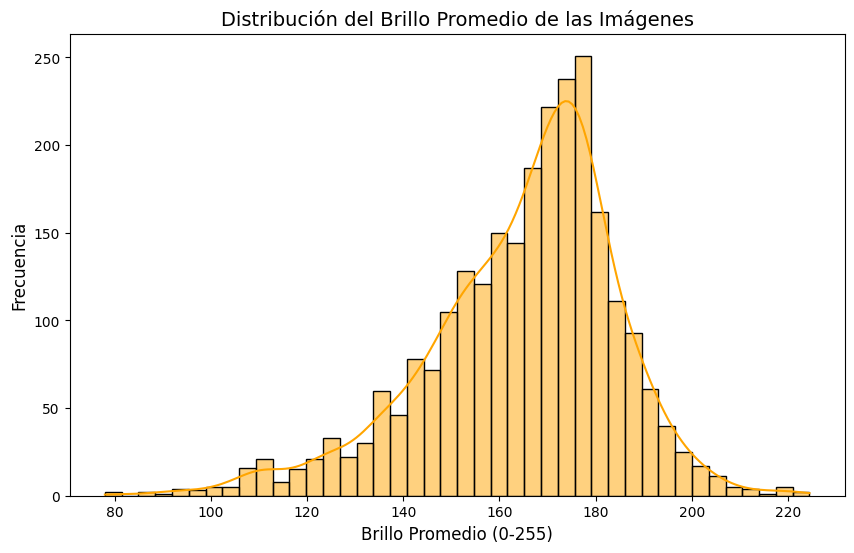

Imágenes con bajo brillo (percentil 5% = 126.02):


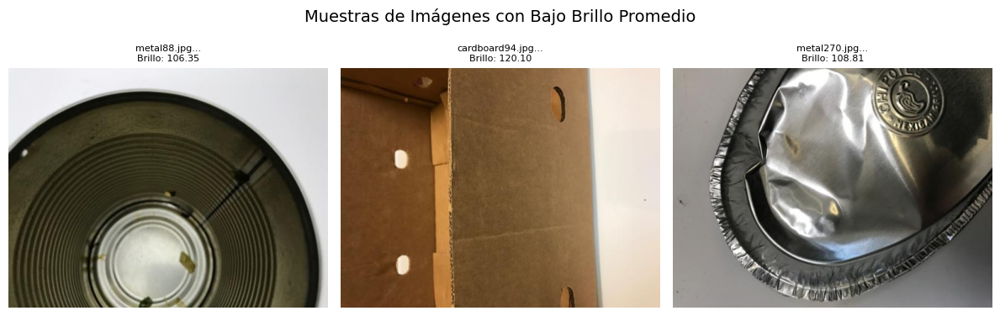

Imágenes con alto brillo (percentil 95% = 191.84):


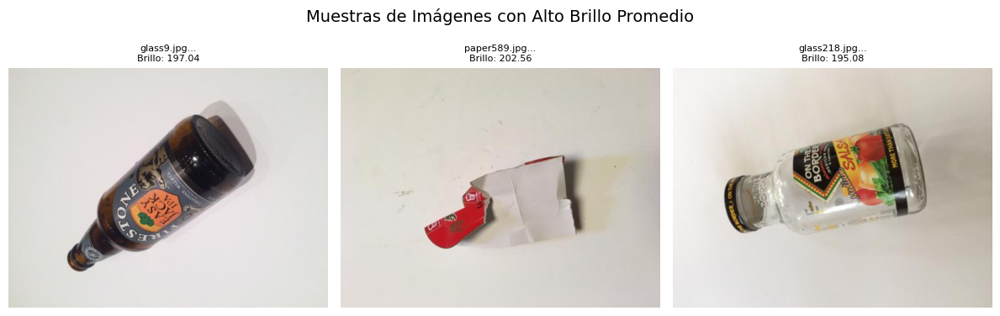


Conclusiones sobre Brillo:
- Una gran variabilidad en el brillo puede dificultar el aprendizaje del modelo.
- Considerar técnicas de normalización de brillo o aumento de datos que modifiquen el brillo/contraste.
- Imágenes extremadamente oscuras o brillantes pueden perder detalles importantes.


In [ ]:
# --- 6. Análisis de Brillo ---
if not df_images.empty:
    print("\n--- Paso 6: Análisis de Brillo ---")

    plt.figure(figsize=(10, 6))
    sns.histplot(df_images['avg_brightness'], kde=True, color='orange')
    plt.title('Distribución del Brillo Promedio de las Imágenes', fontsize=14)
    plt.xlabel('Brillo Promedio (0-255)', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.show()

    # Mostrar imágenes con brillo extremo (si existen y son informativas)
    low_brightness_threshold = df_images['avg_brightness'].quantile(0.05) # 5% más oscuras
    high_brightness_threshold = df_images['avg_brightness'].quantile(0.95) # 5% más claras

    print(f"Imágenes con bajo brillo (percentil 5% = {low_brightness_threshold:.2f}):")
    low_brightness_samples = df_images[df_images['avg_brightness'] <= low_brightness_threshold].sample(min(3, len(df_images[df_images['avg_brightness'] <= low_brightness_threshold])))
    if not low_brightness_samples.empty:
        plt.figure(figsize=(12,4))
        for i, (_, row) in enumerate(low_brightness_samples.iterrows()):
            plt.subplot(1, 3, i+1)
            img = Image.open(row['path'])
            plt.imshow(img)
            plt.title(f"{row['filename'][:15]}...\nBrillo: {row['avg_brightness']:.2f}", fontsize=8)
            plt.axis('off')
        plt.suptitle("Muestras de Imágenes con Bajo Brillo Promedio", fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    print(f"Imágenes con alto brillo (percentil 95% = {high_brightness_threshold:.2f}):")
    high_brightness_samples = df_images[df_images['avg_brightness'] >= high_brightness_threshold].sample(min(3, len(df_images[df_images['avg_brightness'] >= high_brightness_threshold])))
    if not high_brightness_samples.empty:
        plt.figure(figsize=(12,4))
        for i, (_, row) in enumerate(high_brightness_samples.iterrows()):
            plt.subplot(1, 3, i+1)
            img = Image.open(row['path'])
            plt.imshow(img)
            plt.title(f"{row['filename'][:15]}...\nBrillo: {row['avg_brightness']:.2f}", fontsize=8)
            plt.axis('off')
        plt.suptitle("Muestras de Imágenes con Alto Brillo Promedio", fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()


    print("\nConclusiones sobre Brillo:")
    print("- Una gran variabilidad en el brillo puede dificultar el aprendizaje del modelo.")
    print("- Considerar técnicas de normalización de brillo o aumento de datos que modifiquen el brillo/contraste.")
    print("- Imágenes extremadamente oscuras o brillantes pueden perder detalles importantes.")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 6.")

Conclusiones sobre el Análisis de Brillo en el proyecto TrashNet


Distribución del brillo:

Las imágenes tienen una distribución de brillo centrada alrededor de 150-160 (en escala 0-255)
Hay algunas imágenes con brillo muy bajo (< 120) y otras con brillo muy alto (> 200)


Problemas identificados:



*   Una gran variabilidad en el brillo puede dificultar el aprendizaje del modelo
*   Imágenes extremadamente oscuras o brillantes pueden perder el brillo/contraste
*   Imágenes extremadamente oscuras o brillantes pueden perder detalles importantes


Impacto en la clasificación:

El brillo puede ser una característica discriminativa para ciertos materiales
Materiales como vidrio, plástico y metal tienen diferentes propiedades de reflectividad

In [ ]:
# Código para normalización y mejora del brillo en imágenes de TrashNet
# Este código implementa técnicas para estandarizar el brillo y mejorar la calidad de las imágenes

import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from skimage import exposure
import pandas as pd

def analizar_brillo(dataset_path, output_path=None):
    """
    Analiza el brillo de las imágenes en el dataset y genera estadísticas.

    Args:
        dataset_path: Ruta al dataset TrashNet
        output_path: Ruta para guardar resultados (opcional)

    Returns:
        DataFrame con estadísticas de brillo por imagen
    """
    print("Analizando brillo de imágenes...")

    # Lista para almacenar resultados
    resultados = []

    # Clases en el dataset
    class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']

    # Procesar cada clase
    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"Procesando {len(imagenes)} imágenes de la clase '{class_name}'...")

        # Procesar cada imagen
        for img_name in tqdm(imagenes):
            img_path = os.path.join(class_path, img_name)

            # Leer imagen
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Convertir a espacio de color HSV
            img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            h, s, v = cv2.split(img_hsv)

            # Calcular estadísticas de brillo (canal V)
            brillo_medio = np.mean(v)
            brillo_std = np.std(v)
            brillo_min = np.min(v)
            brillo_max = np.max(v)
            brillo_mediana = np.median(v)

            # Calcular histograma de brillo
            hist = cv2.calcHist([v], [0], None, [256], [0, 256])

            # Determinar categoría de brillo
            if brillo_medio < 120:
                categoria_brillo = "bajo"
            elif brillo_medio > 200:
                categoria_brillo = "alto"
            else:
                categoria_brillo = "normal"

            # Guardar resultados
            resultados.append({
                'filename': img_name,
                'class': class_name,
                'class_id': class_idx,
                'brillo_medio': brillo_medio,
                'brillo_std': brillo_std,
                'brillo_min': brillo_min,
                'brillo_max': brillo_max,
                'brillo_mediana': brillo_mediana,
                'categoria_brillo': categoria_brillo
            })

    # Convertir a DataFrame
    df_brillo = pd.DataFrame(resultados)

    # Guardar resultados
    if output_path:
        os.makedirs(output_path, exist_ok=True)
        df_brillo.to_csv(os.path.join(output_path, 'estadisticas_brillo.csv'), index=False)

    # Mostrar estadísticas
    print("\nEstadísticas de brillo por clase:")
    stats_por_clase = df_brillo.groupby('class')['brillo_medio'].agg(['mean', 'std', 'min', 'max'])
    print(stats_por_clase)

    print("\nDistribución de categorías de brillo:")
    print(df_brillo['categoria_brillo'].value_counts())

    return df_brillo

def normalizar_brillo(dataset_path, output_path, metodo='clahe', target_brightness=None):
    """
    Normaliza el brillo de todas las imágenes en el dataset y guarda las versiones mejoradas.

    Args:
        dataset_path: Ruta al dataset original
        output_path: Ruta para guardar las imágenes normalizadas
        metodo: Método de normalización ('clahe', 'histeq', 'rescale', 'gamma')
        target_brightness: Brillo objetivo para el método 'rescale' (0-255)
    """
    print(f"Normalizando brillo de imágenes usando método: {metodo}...")

    # Clases en el dataset
    class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']

    # Crear directorios de salida
    for class_name in class_names:
        os.makedirs(os.path.join(output_path, class_name), exist_ok=True)

    # Configurar CLAHE (si se usa ese método)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    # Contar imágenes procesadas
    total_procesadas = 0

    # Procesar cada clase
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"Procesando {len(imagenes)} imágenes de la clase '{class_name}'...")

        # Procesar cada imagen
        for img_name in tqdm(imagenes):
            img_path = os.path.join(class_path, img_name)

            # Leer imagen
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Aplicar el método de normalización seleccionado
            if metodo == 'clahe':
                # CLAHE: Mejora el contraste local adaptativo
                img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                l, a, b = cv2.split(img_lab)
                l_normalizado = clahe.apply(l)
                img_normalizada = cv2.merge((l_normalizado, a, b))
                img_normalizada = cv2.cvtColor(img_normalizada, cv2.COLOR_LAB2BGR)

            elif metodo == 'histeq':
                # Ecualización de histograma global
                img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                h, s, v = cv2.split(img_hsv)
                v_eq = cv2.equalizeHist(v)
                img_hsv_eq = cv2.merge([h, s, v_eq])
                img_normalizada = cv2.cvtColor(img_hsv_eq, cv2.COLOR_HSV2BGR)

            elif metodo == 'rescale':
                # Reescalar al brillo objetivo
                if target_brightness is None:
                    target_brightness = 150  # Valor predeterminado

                img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                h, s, v = cv2.split(img_hsv)
                brillo_actual = np.mean(v)

                # Factor de ajuste
                if brillo_actual > 0:
                    factor = target_brightness / brillo_actual
                    v_adjusted = np.clip(v * factor, 0, 255).astype(np.uint8)
                    img_hsv_adjusted = cv2.merge([h, s, v_adjusted])
                    img_normalizada = cv2.cvtColor(img_hsv_adjusted, cv2.COLOR_HSV2BGR)
                else:
                    img_normalizada = img  # Sin cambios si brillo actual es 0

            elif metodo == 'gamma':
                # Corrección gamma para ajustar brillo
                img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                h, s, v = cv2.split(img_hsv)
                brillo_actual = np.mean(v)

                # Determinar gamma basado en brillo actual
                if brillo_actual < 120:  # Oscuro
                    gamma = 0.8  # Valor < 1 aumenta brillo
                elif brillo_actual > 200:  # Brillante
                    gamma = 1.2  # Valor > 1 reduce brillo
                else:
                    gamma = 1.0  # Sin cambios

                # Aplicar corrección gamma al canal V
                v_gamma = np.power(v / 255.0, gamma) * 255.0
                v_gamma = np.clip(v_gamma, 0, 255).astype(np.uint8)

                img_hsv_gamma = cv2.merge([h, s, v_gamma])
                img_normalizada = cv2.cvtColor(img_hsv_gamma, cv2.COLOR_HSV2BGR)

            else:
                # Si no se reconoce el método, mantener imagen original
                print(f"Método no reconocido: {metodo}. Usando imagen original.")
                img_normalizada = img

            # Guardar imagen normalizada
            output_img_path = os.path.join(output_path, class_name, img_name)
            cv2.imwrite(output_img_path, img_normalizada)
            total_procesadas += 1

    print(f"\nProceso completado. Se normalizaron {total_procesadas} imágenes.")
    print(f"Imágenes guardadas en: {output_path}")

def visualizar_efectos_normalizacion(dataset_original, dataset_normalizado, num_ejemplos=3):
    """
    Visualiza comparaciones antes/después de la normalización de brillo.

    Args:
        dataset_original: Ruta al dataset original
        dataset_normalizado: Ruta al dataset normalizado
        num_ejemplos: Número de ejemplos por clase a visualizar
    """
    print("Visualizando efectos de la normalización de brillo...")

    # Clases en el dataset
    class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']

    # Configuración del gráfico
    fig_height = len(class_names) * num_ejemplos * 2
    plt.figure(figsize=(15, fig_height))

    plot_idx = 1

    # Iterar por cada clase
    for class_name in class_names:
        class_path_orig = os.path.join(dataset_original, class_name)
        class_path_norm = os.path.join(dataset_normalizado, class_name)

        if not os.path.exists(class_path_orig) or not os.path.exists(class_path_norm):
            print(f"¡Advertencia! Carpeta no encontrada para clase {class_name}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path_orig)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Seleccionar muestras aleatorias
        import random
        random.seed(42)  # Para reproducibilidad

        if len(imagenes) > num_ejemplos:
            muestras = random.sample(imagenes, num_ejemplos)
        else:
            muestras = imagenes

        # Visualizar cada muestra
        for img_name in muestras:
            # Cargar imagen original
            img_path_orig = os.path.join(class_path_orig, img_name)
            img_orig = cv2.imread(img_path_orig)
            if img_orig is None:
                print(f"Error al leer imagen original: {img_path_orig}")
                continue

            # Cargar imagen normalizada
            img_path_norm = os.path.join(class_path_norm, img_name)
            img_norm = cv2.imread(img_path_norm)
            if img_norm is None:
                print(f"Error al leer imagen normalizada: {img_path_norm}")
                continue

            # Convertir a RGB para visualización
            img_orig_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
            img_norm_rgb = cv2.cvtColor(img_norm, cv2.COLOR_BGR2RGB)

            # Calcular brillo medio para ambas imágenes
            img_orig_hsv = cv2.cvtColor(img_orig, cv2.COLOR_BGR2HSV)
            img_norm_hsv = cv2.cvtColor(img_norm, cv2.COLOR_BGR2HSV)

            brillo_orig = np.mean(img_orig_hsv[:,:,2])
            brillo_norm = np.mean(img_norm_hsv[:,:,2])

            # Visualizar imagen original
            plt.subplot(len(class_names) * num_ejemplos, 2, plot_idx)
            plt.imshow(img_orig_rgb)
            plt.title(f"{class_name}: Original\nBrillo: {brillo_orig:.1f}")
            plt.axis('off')

            # Visualizar imagen normalizada
            plt.subplot(len(class_names) * num_ejemplos, 2, plot_idx + 1)
            plt.imshow(img_norm_rgb)
            plt.title(f"{class_name}: Normalizada\nBrillo: {brillo_norm:.1f}")
            plt.axis('off')

            plot_idx += 2

    plt.tight_layout()
    plt.savefig('comparacion_normalizacion_brillo.png')
    plt.close()

    print("Visualizaciones guardadas como 'comparacion_normalizacion_brillo.png'")

def crear_dataset_aumentado_con_brillo(df_brillo, dataset_path, output_path, aumentar_oscuras=True, aumentar_brillantes=True):
    """
    Crea un dataset balanceado aplicando diferentes técnicas de normalización
    según el brillo de cada imagen.

    Args:
        df_brillo: DataFrame con estadísticas de brillo
        dataset_path: Ruta al dataset original
        output_path: Ruta para guardar el dataset aumentado
        aumentar_oscuras: Si se deben generar versiones de imágenes oscuras
        aumentar_brillantes: Si se deben generar versiones de imágenes brillantes
    """
    print("Creando dataset equilibrado con ajustes de brillo...")

    # Crear directorios de salida
    class_names = df_brillo['class'].unique()
    for class_name in class_names:
        os.makedirs(os.path.join(output_path, class_name), exist_ok=True)

    # Contar imágenes por clase
    conteo_por_clase = df_brillo['class'].value_counts()
    clase_mayoritaria = conteo_por_clase.idxmax()
    max_count = conteo_por_clase.max()

    # Configurar CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    # Procesar cada clase
    for class_name in class_names:
        class_df = df_brillo[df_brillo['class'] == class_name]
        class_count = len(class_df)

        print(f"Procesando clase '{class_name}': {class_count} imágenes originales")

        # Copiar imágenes originales
        for _, row in tqdm(class_df.iterrows(), total=len(class_df), desc="Copiando originales"):
            img_name = row['filename']
            img_path = os.path.join(dataset_path, class_name, img_name)

            # Leer imagen
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Guardar copia original
            output_img_path = os.path.join(output_path, class_name, img_name)
            cv2.imwrite(output_img_path, img)

        # Si la clase tiene menos ejemplos que la clase mayoritaria, aumentar con ajustes de brillo
        if class_count < max_count:
            # Número de imágenes adicionales necesarias
            num_adicionales = max_count - class_count

            print(f"Generando {num_adicionales} imágenes adicionales para clase '{class_name}'")

            # Seleccionar imágenes para aumentar (priorizar las que tienen brillo extremo)
            if aumentar_oscuras and aumentar_brillantes:
                # Priorizar imágenes con brillo extremo
                df_extremas = class_df[(class_df['categoria_brillo'] == 'bajo') |
                                        (class_df['categoria_brillo'] == 'alto')]

                if len(df_extremas) < num_adicionales:
                    # Si no hay suficientes imágenes extremas, añadir algunas normales
                    df_normales = class_df[class_df['categoria_brillo'] == 'normal']
                    num_normales = num_adicionales - len(df_extremas)

                    if len(df_normales) > 0:
                        df_normales_seleccionadas = df_normales.sample(min(num_normales, len(df_normales)),
                                                                         random_state=42)
                        df_para_aumentar = pd.concat([df_extremas, df_normales_seleccionadas], ignore_index=True)
                    else:
                        df_para_aumentar = df_extremas.sample(num_adicionales, random_state=42, replace=True)
                else:
                    # Si hay suficientes imágenes extremas, seleccionar aleatoriamente
                    df_para_aumentar = df_extremas.sample(num_adicionales, random_state=42, replace=True)

            elif aumentar_oscuras:
                # Priorizar imágenes oscuras
                df_oscuras = class_df[class_df['categoria_brillo'] == 'bajo']

                if len(df_oscuras) < num_adicionales:
                    # Si no hay suficientes imágenes oscuras, añadir algunas normales
                    df_otras = class_df[class_df['categoria_brillo'] != 'bajo']
                    num_otras = num_adicionales - len(df_oscuras)

                    if len(df_otras) > 0:
                        df_otras_seleccionadas = df_otras.sample(min(num_otras, len(df_otras)),
                                                                   random_state=42, replace=True)
                        df_para_aumentar = pd.concat([df_oscuras, df_otras_seleccionadas], ignore_index=True)
                    else:
                        df_para_aumentar = df_oscuras.sample(num_adicionales, random_state=42, replace=True)
                else:
                    # Si hay suficientes imágenes oscuras, seleccionar aleatoriamente
                    df_para_aumentar = df_oscuras.sample(num_adicionales, random_state=42, replace=True)

            elif aumentar_brillantes:
                # Priorizar imágenes brillantes
                df_brillantes = class_df[class_df['categoria_brillo'] == 'alto']

                if len(df_brillantes) < num_adicionales:
                    # Si no hay suficientes imágenes brillantes, añadir algunas normales
                    df_otras = class_df[class_df['categoria_brillo'] != 'alto']
                    num_otras = num_adicionales - len(df_brillantes)

                    if len(df_otras) > 0:
                        df_otras_seleccionadas = df_otras.sample(min(num_otras, len(df_otras)),
                                                                   random_state=42, replace=True)
                        df_para_aumentar = pd.concat([df_brillantes, df_otras_seleccionadas], ignore_index=True)
                    else:
                        df_para_aumentar = df_brillantes.sample(num_adicionales, random_state=42, replace=True)
                else:
                    # Si hay suficientes imágenes brillantes, seleccionar aleatoriamente
                    df_para_aumentar = df_brillantes.sample(num_adicionales, random_state=42, replace=True)

            else:
                # Si no se especifica, seleccionar aleatoriamente
                df_para_aumentar = class_df.sample(num_adicionales, random_state=42, replace=True)

            # Aplicar diferentes técnicas de normalización según el brillo original
            counter = 0
            for _, row in tqdm(df_para_aumentar.iterrows(), total=len(df_para_aumentar), desc="Generando nuevas"):
                img_name = row['filename']
                img_path = os.path.join(dataset_path, class_name, img_name)

                # Leer imagen
                img = cv2.imread(img_path)
                if img is None:
                    print(f"Error al leer imagen: {img_path}")
                    continue

                # Determinar técnica según brillo
                categoria = row['categoria_brillo']
                brillo_medio = row['brillo_medio']

                if categoria == 'bajo':
                    # Para imágenes oscuras, aumentar brillo con gamma o CLAHE
                    if counter % 2 == 0:  # Alternar métodos
                        # Corrección gamma
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        gamma = 0.7  # Valor < 1 aumenta brillo
                        v_gamma = np.power(v / 255.0, gamma) * 255.0
                        v_gamma = np.clip(v_gamma, 0, 255).astype(np.uint8)
                        img_hsv_gamma = cv2.merge([h, s, v_gamma])
                        img_nueva = cv2.cvtColor(img_hsv_gamma, cv2.COLOR_HSV2BGR)
                        metodo = 'gamma'
                    else:
                        # CLAHE
                        img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                        l, a, b = cv2.split(img_lab)
                        l_clahe = clahe.apply(l)
                        img_lab_clahe = cv2.merge((l_clahe, a, b))
                        img_nueva = cv2.cvtColor(img_lab_clahe, cv2.COLOR_LAB2BGR)
                        metodo = 'clahe'

                elif categoria == 'alto':
                    # Para imágenes brillantes, reducir brillo o aplicar ecualización
                    if counter % 2 == 0:  # Alternar métodos
                        # Reducir brillo con gamma
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        gamma = 1.3  # Valor > 1 reduce brillo
                        v_gamma = np.power(v / 255.0, gamma) * 255.0
                        v_gamma = np.clip(v_gamma, 0, 255).astype(np.uint8)
                        img_hsv_gamma = cv2.merge([h, s, v_gamma])
                        img_nueva = cv2.cvtColor(img_hsv_gamma, cv2.COLOR_HSV2BGR)
                        metodo = 'gamma_reduce'
                    else:
                        # Ecualización de histograma
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        v_eq = cv2.equalizeHist(v)
                        img_hsv_eq = cv2.merge([h, s, v_eq])
                        img_nueva = cv2.cvtColor(img_hsv_eq, cv2.COLOR_HSV2BGR)
                        metodo = 'histeq'

                else:  # normal
                    # Para imágenes normales, aplicar mejoras sutiles
                    if counter % 3 == 0:
                        # Ligero aumento de brillo
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        v_adj = np.clip(v * 1.1, 0, 255).astype(np.uint8)
                        img_hsv_adj = cv2.merge([h, s, v_adj])
                        img_nueva = cv2.cvtColor(img_hsv_adj, cv2.COLOR_HSV2BGR)
                        metodo = 'bright_up'
                    elif counter % 3 == 1:
                        # Ligera reducción de brillo
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        v_adj = np.clip(v * 0.9, 0, 255).astype(np.uint8)
                        img_hsv_adj = cv2.merge([h, s, v_adj])
                        img_nueva = cv2.cvtColor(img_hsv_adj, cv2.COLOR_HSV2BGR)
                        metodo = 'bright_down'
                    else:
                        # CLAHE suave
                        clahe_suave = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(4, 4))
                        img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                        l, a, b = cv2.split(img_lab)
                        l_clahe = clahe_suave.apply(l)
                        img_lab_clahe = cv2.merge((l_clahe, a, b))
                        img_nueva = cv2.cvtColor(img_lab_clahe, cv2.COLOR_LAB2BGR)
                        metodo = 'clahe_soft'

                # Generar nombre para la nueva imagen
                base_name, ext = os.path.splitext(img_name)
                nuevo_nombre = f"{base_name}_bright_{metodo}{counter}{ext}"

                # Guardar nueva imagen
                output_img_path = os.path.join(output_path, class_name, nuevo_nombre)
                cv2.imwrite(output_img_path, img_nueva)

                counter += 1

    # Contar imágenes en el dataset aumentado
    total_originales = len(df_brillo)
    total_aumentadas = 0

    for class_name in class_names:
        class_path = os.path.join(output_path, class_name)
        num_imagenes = len([f for f in os.listdir(class_path)
                              if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        total_aumentadas += num_imagenes
        print(f"Clase '{class_name}': {num_imagenes} imágenes")

    print(f"\nTotal imágenes originales: {total_originales}")
    print(f"Total imágenes en dataset aumentado: {total_aumentadas}")
    print(f"Incremento: {total_aumentadas - total_originales} imágenes")

def main():
    """
    Función principal que ejecuta el análisis y normalización de brillo.
    """
    # Configurar rutas
    dataset_path = '/content/trashnet_images/dataset-resized'  # Ajustar a la ruta real
    output_base = '/content/output_brillo'  # Ajustar a la ruta de salida deseada

    # Crear directorios de salida
    os.makedirs(output_base, exist_ok=True)
    normalized_path = os.path.join(output_base, 'trashnet_normalized')
    balanced_path = os.path.join(output_base, 'trashnet_balanced_brightness')

    # 1. Analizar brillo de las imágenes
    df_brillo = analizar_brillo(dataset_path, output_base)

    # 2. Visualizar distribución de brillo (opcional)
    plt.figure(figsize=(10, 6))
    for clase in df_brillo['class'].unique():
        plt.hist(df_brillo[df_brillo['class'] == clase]['brillo_medio'],
                 alpha=0.5, label=clase, bins=30)

    plt.title('Distribución de Brillo Promedio por Clase')
    plt.xlabel('Brillo Promedio (0-255)')
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_base, 'distribucion_brillo_por_clase.png'))
    plt.close()

    # 3. Normalizar brillo con CLAHE (mejor para preservar detalles)
    normalizar_brillo(dataset_path, normalized_path, metodo='clahe')

    # 4. Visualizar efectos de la normalización
    visualizar_efectos_normalizacion(dataset_path, normalized_path)

    # 5. Crear dataset aumentado con ajustes de brillo para balancear clases
    crear_dataset_aumentado_con_brillo(df_brillo, dataset_path, balanced_path)

    print("\n===== RESUMEN DE SOLUCIONES DE BRILLO =====")
    print("1. Se analizó el brillo de todas las imágenes del dataset.")
    print("2. Se normalizaron todas las imágenes con CLAHE para mejorar la visibilidad de detalles.")
    print("3. Se creó un dataset balanceado con ajustes de brillo adaptados por clase.")
    print("4. Se generaron visualizaciones de los efectos de la normalización.")
    print("\nSolución completa para los problemas de brillo identificados en el EDA.")
    print("===== FIN DEL PROCESO =====")

if __name__ == "__main__":
    main()

Analizando brillo de imágenes...
Procesando 403 imágenes de la clase 'cardboard'...


100%|██████████| 403/403 [00:02<00:00, 185.00it/s]


Procesando 501 imágenes de la clase 'glass'...


100%|██████████| 501/501 [00:02<00:00, 195.13it/s]


Procesando 410 imágenes de la clase 'metal'...


100%|██████████| 410/410 [00:02<00:00, 151.69it/s]


Procesando 594 imágenes de la clase 'paper'...


100%|██████████| 594/594 [00:03<00:00, 197.41it/s]


Procesando 482 imágenes de la clase 'plastic'...


100%|██████████| 482/482 [00:02<00:00, 218.57it/s]


Procesando 137 imágenes de la clase 'trash'...


100%|██████████| 137/137 [00:00<00:00, 192.82it/s]



Estadísticas de brillo por clase:
                 mean        std         min         max
class                                                   
cardboard  173.670575  20.011614   93.737289  226.067301
glass      182.536482  13.563958  105.815984  219.108765
metal      171.274916  25.682899   79.153625  228.657267
paper      175.107305  17.687003   92.044479  211.543223
plastic    180.428109  13.884474  100.178080  220.270075
trash      179.898508  17.295440  108.654978  208.518992

Distribución de categorías de brillo:
categoria_brillo
normal    2348
alto       146
bajo        33
Name: count, dtype: int64
Normalizando brillo de imágenes usando método: clahe...
Procesando 403 imágenes de la clase 'cardboard'...


100%|██████████| 403/403 [00:03<00:00, 103.14it/s]


Procesando 501 imágenes de la clase 'glass'...


100%|██████████| 501/501 [00:05<00:00, 99.77it/s] 


Procesando 410 imágenes de la clase 'metal'...


100%|██████████| 410/410 [00:03<00:00, 118.57it/s]


Procesando 594 imágenes de la clase 'paper'...


100%|██████████| 594/594 [00:05<00:00, 101.97it/s]


Procesando 482 imágenes de la clase 'plastic'...


100%|██████████| 482/482 [00:04<00:00, 100.98it/s]


Procesando 137 imágenes de la clase 'trash'...


100%|██████████| 137/137 [00:01<00:00, 122.39it/s]



Proceso completado. Se normalizaron 2527 imágenes.
Imágenes guardadas en: /content/output_brillo/trashnet_normalized
Visualizando efectos de la normalización de brillo...
Visualizaciones guardadas como 'comparacion_normalizacion_brillo.png'
Creando dataset equilibrado con ajustes de brillo...
Procesando clase 'cardboard': 403 imágenes originales


Copiando originales: 100%|██████████| 403/403 [00:01<00:00, 373.22it/s]


Generando 191 imágenes adicionales para clase 'cardboard'


Generando nuevas: 100%|██████████| 191/191 [00:01<00:00, 107.22it/s]


Procesando clase 'glass': 501 imágenes originales


Copiando originales: 100%|██████████| 501/501 [00:01<00:00, 284.18it/s]


Generando 93 imágenes adicionales para clase 'glass'


Generando nuevas: 100%|██████████| 93/93 [00:00<00:00, 134.81it/s]


Procesando clase 'metal': 410 imágenes originales


Copiando originales: 100%|██████████| 410/410 [00:00<00:00, 426.58it/s]


Generando 184 imágenes adicionales para clase 'metal'


Generando nuevas: 100%|██████████| 184/184 [00:01<00:00, 126.88it/s]


Procesando clase 'paper': 594 imágenes originales


Copiando originales: 100%|██████████| 594/594 [00:01<00:00, 385.38it/s]


Procesando clase 'plastic': 482 imágenes originales


Copiando originales: 100%|██████████| 482/482 [00:01<00:00, 451.96it/s]


Generando 112 imágenes adicionales para clase 'plastic'


Generando nuevas: 100%|██████████| 112/112 [00:00<00:00, 125.77it/s]


Procesando clase 'trash': 137 imágenes originales


Copiando originales: 100%|██████████| 137/137 [00:00<00:00, 415.61it/s]


Generando 457 imágenes adicionales para clase 'trash'


Generando nuevas: 100%|██████████| 137/137 [00:00<00:00, 143.03it/s]

Clase 'cardboard': 594 imágenes
Clase 'glass': 594 imágenes
Clase 'metal': 594 imágenes
Clase 'paper': 594 imágenes
Clase 'plastic': 594 imágenes
Clase 'trash': 274 imágenes

Total imágenes originales: 2527
Total imágenes en dataset aumentado: 3244
Incremento: 717 imágenes

===== RESUMEN DE SOLUCIONES DE BRILLO =====
1. Se analizó el brillo de todas las imágenes del dataset.
2. Se normalizaron todas las imágenes con CLAHE para mejorar la visibilidad de detalles.
3. Se creó un dataset balanceado con ajustes de brillo adaptados por clase.
4. Se generaron visualizaciones de los efectos de la normalización.

Solución completa para los problemas de brillo identificados en el EDA.
===== FIN DEL PROCESO =====



--- Paso 7: Inspección de Calidad, Artefactos y Fondos ---
Seleccionaremos algunas imágenes aleatorias para inspeccionarlas:


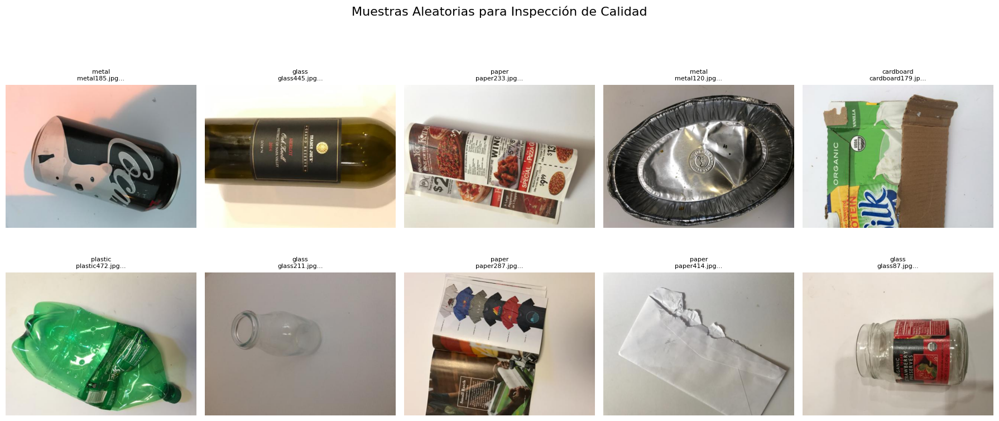

In [21]:
# --- 7. Inspección de Calidad, Artefactos y Complejidad del Fondo ---
if not df_images.empty:
    print("\n--- Paso 7: Inspección de Calidad, Artefactos y Fondos ---")
    print("Seleccionaremos algunas imágenes aleatorias para inspeccionarlas:")

    num_random_samples_inspection = 10
    random_samples = df_images.sample(min(num_random_samples_inspection, len(df_images)))

    plt.figure(figsize=(18, (num_random_samples_inspection // 5 + 1)*4 ))
    plt.suptitle("Muestras Aleatorias para Inspección de Calidad", fontsize=16)
    for i, (_, row) in enumerate(random_samples.iterrows()):
        plt.subplot((num_random_samples_inspection // 5 + 1), 5, i + 1)
        try:
            img = Image.open(row['path'])
            plt.imshow(img)
            plt.title(f"{row['class']}\n{row['filename'][:15]}...", fontsize=8)
            plt.axis('off')
        except Exception as e:
            print(f"Error al mostrar {row['path']}: {e}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


else:
    print("DataFrame de imágenes vacío, omitiendo Paso 8.")

# 2. Modelo Resnet 18 con Balanceo (correción)

En la seccion del EDA hicimos un análisis de la distribución de clases en nuestro conjunto de dato, en donde identificamos el desbalanceo de clases.

En esta parte separaremos los datos en entrenamiento, validación y prueba (tal cual recomendaron en la presentación final).

Para abordar el desafío del desequilibrio de clases, aplicaremos técnicas de aumento de datos exclusivamente al conjunto de entrenamiento, preparando así un conjunto balanceado para optimizar el aprendizaje del modelo. Posteriormente, configuraremos los dataloaders necesarios para la arquitectura ResNet18 y procederemos a la carga y modificación de un modelo ResNet18 pre-entrenado, adaptándolo a nuestra tarea específica.

 El entrenamiento se llevará a cabo con el conjunto de entrenamiento balanceado, validando continuamente con el conjunto de validación original. Finalmente, evaluaremos el rendimiento de nuestro modelo en el conjunto de prueba original.

## Analisis de distribicón de clases



## Analisis de distribución de clases



Clases encontradas: ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
Número de clases: 6


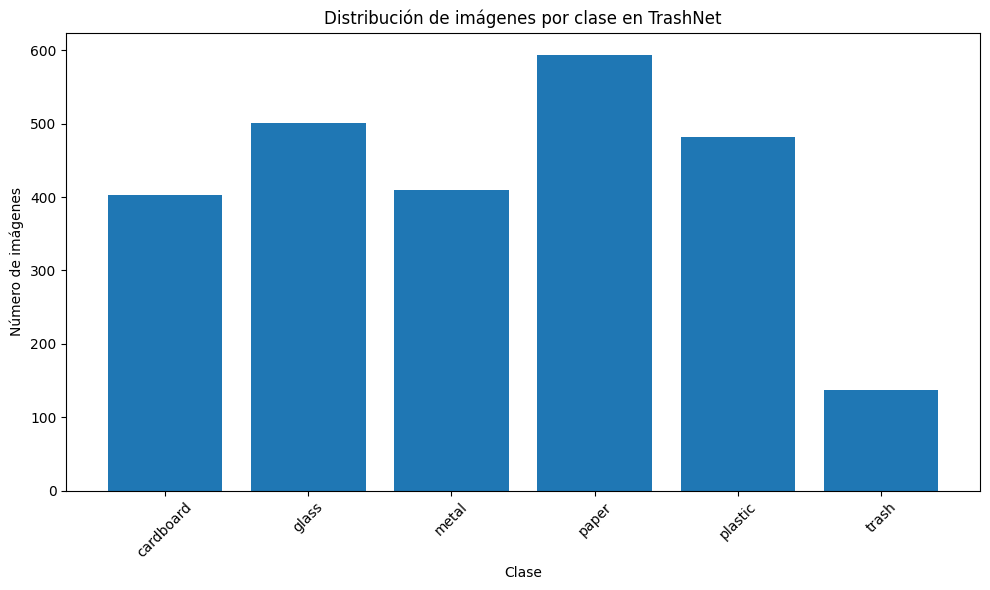


Total de imágenes: 2527

Distribución por clase:
cardboard: 403 imágenes (15.95%)
glass: 501 imágenes (19.83%)
metal: 410 imágenes (16.22%)
paper: 594 imágenes (23.51%)
plastic: 482 imágenes (19.07%)
trash: 137 imágenes (5.42%)

Ratio de desbalanceo: 4.34
Clase con más imágenes: paper (594)
Clase con menos imágenes: trash (137)


In [12]:
import os
import matplotlib.pyplot as plt
from collections import Counter

data_dir = '/content/trashnet_images/dataset-resized'

# Verificar las clases disponibles
classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
print(f"Clases encontradas: {classes}")
print(f"Número de clases: {len(classes)}")

# Contar imágenes por clase
class_counts = {}
for class_name in classes:
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))])
        class_counts[class_name] = count

# Visualizar distribución de clases
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Clase')
plt.ylabel('Número de imágenes')
plt.title('Distribución de imágenes por clase en TrashNet')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Mostrar estadísticas
total_images = sum(class_counts.values())
print(f"\nTotal de imágenes: {total_images}")
print("\nDistribución por clase:")
for class_name, count in class_counts.items():
    percentage = (count / total_images) * 100
    print(f"{class_name}: {count} imágenes ({percentage:.2f}%)")

# Identificar desbalanceo
if len(class_counts) > 1:
    max_count = max(class_counts.values())
    min_count = min(class_counts.values())
    imbalance_ratio = max_count / min_count if min_count > 0 else float('inf')
    print(f"\nRatio de desbalanceo: {imbalance_ratio:.2f}")
    print(f"Clase con más imágenes: {max(class_counts, key=class_counts.get)} ({max_count})")
    print(f"Clase con menos imágenes: {min(class_counts, key=class_counts.get)} ({min_count})")
else:
    print("\nOnly one class found, no imbalance to report.")

## Split dataset

Dividiremos el conjunto de datos original en conjuntos de entrenamiento, validación y prueba. (Esto lo dijo el profe al grupo 1)

In [13]:
from sklearn.model_selection import train_test_split
import os
import pandas as pd

image_paths = []
labels = []
data_dir = '/content/trashnet_images/dataset-resized'
classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(class_dir, img_name))
                labels.append(class_to_idx[class_name])


image_paths_series = pd.Series(image_paths)
labels_series = pd.Series(labels)

# training (80%) and temporary (validation + test, 20%) sets
X_train, X_temp, y_train, y_temp = train_test_split(
    image_paths_series, labels_series, test_size=0.2, random_state=42, stratify=labels_series
)

# Split temporary set into validation (50% of temp, i.e., 10% of total) and test (50% of temp, i.e., 10% of total) sets
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

print(f"Number of images in training set: {len(X_train)}")
print(f"Number of images in validation set: {len(X_val)}")
print(f"Number of images in test set: {len(X_test)}")

print("\nClass distribution in training set:")
print(y_train.value_counts(normalize=True).sort_index())
print("\nClass distribution in validation set:")
print(y_val.value_counts(normalize=True).sort_index())
print("\nClass distribution in test set:")
print(y_test.value_counts(normalize=True).sort_index())

Number of images in training set: 2021
Number of images in validation set: 253
Number of images in test set: 253

Class distribution in training set:
0    0.159327
1    0.198417
2    0.162296
3    0.235032
4    0.190500
5    0.054429
Name: proportion, dtype: float64

Class distribution in validation set:
0    0.158103
1    0.197628
2    0.162055
3    0.237154
4    0.189723
5    0.055336
Name: proportion, dtype: float64

Class distribution in test set:
0    0.162055
1    0.197628
2    0.162055
3    0.233202
4    0.193676
5    0.051383
Name: proportion, dtype: float64


## Correción de desbalances (solo en Train Set)



Implementaremos la ampliación de datos para las clases minoritarias y asi crear una nueva estructura de conjunto de datos de entrenamiento (train) equilibrada copiando las imágenes de entrenamiento originales y luego ampliando las imágenes de las clases minoritarias (con Data Augmentation) para alcanzar el recuento objetivo.

Target number of images per class in balanced training set: 475
Creating balanced training dataset directory structure at: /content/trashnet_images/dataset-balanced-train
Copying original training images to the new balanced training directory...


100%|██████████| 2021/2021 [00:00<00:00, 5291.96it/s]


Applying augmentation to minority classes in training set...
Augmenting class 'cardboard': 322 -> 475 (153 needed)


Augmenting cardboard: 100%|██████████| 153/153 [00:04<00:00, 31.43it/s]


Augmenting class 'glass': 401 -> 475 (74 needed)


Augmenting glass: 100%|██████████| 74/74 [00:01<00:00, 39.10it/s]


Augmenting class 'metal': 328 -> 475 (147 needed)


Augmenting metal: 100%|██████████| 147/147 [00:03<00:00, 39.12it/s]


Augmenting class 'plastic': 385 -> 475 (90 needed)


Augmenting plastic: 100%|██████████| 90/90 [00:02<00:00, 38.59it/s]


Augmenting class 'trash': 110 -> 475 (365 needed)


Augmenting trash: 100%|██████████| 365/365 [00:10<00:00, 35.90it/s]



Verifying class distribution in the balanced training dataset...


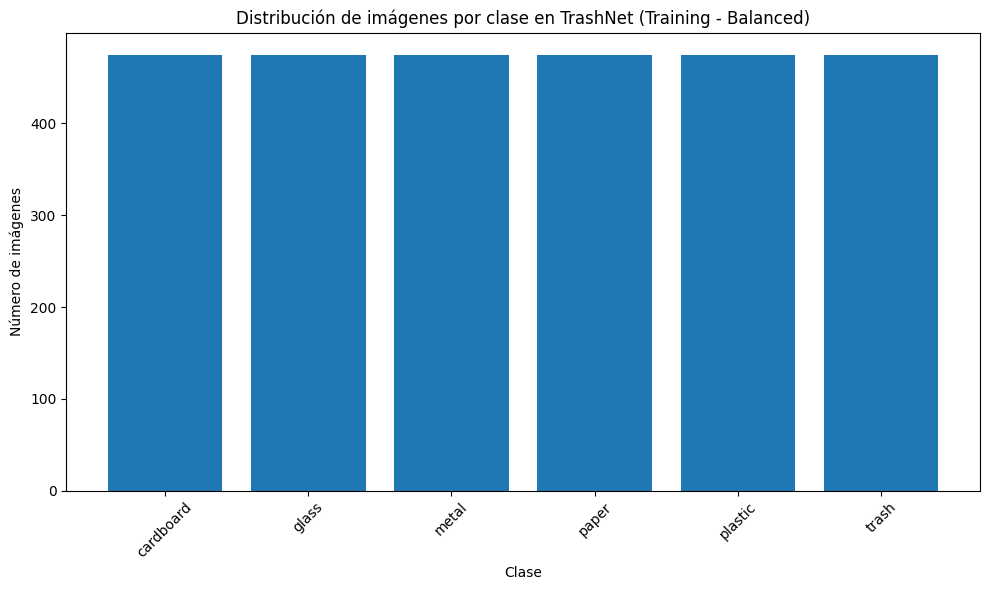


Total de imágenes en dataset de entrenamiento balanceado: 2850

Distribución por clase en dataset de entrenamiento balanceado:
cardboard: 475 imágenes (16.67%)
glass: 475 imágenes (16.67%)
metal: 475 imágenes (16.67%)
paper: 475 imágenes (16.67%)
plastic: 475 imágenes (16.67%)
trash: 475 imágenes (16.67%)

Ratio de desbalanceo en dataset de entrenamiento balanceado: 1.00
Class imbalance appears to be significantly reduced in the training set.


In [14]:
import os
import shutil
from collections import Counter
from PIL import Image
import random
import torchvision.transforms as transforms
from tqdm import tqdm
import pandas as pd # Import pandas

# Definir la nueva ruta del conjunto de datos de entrenamiento equilibrado
balanced_train_data_dir = '/content/trashnet_images/dataset-balanced-train'

# Obtenga los nombres de clase y la asignación de class_to_idx de la estructura del conjunto de datos original
data_dir = '/content/trashnet_images/dataset-resized'
classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}


if isinstance(y_train, pd.Series):
    train_class_counts = y_train.value_counts().sort_index()
else:
    train_class_counts = pd.Series(y_train).value_counts().sort_index()

target_count = train_class_counts.max()
print(f"Target number of images per class in balanced training set: {target_count}")

# Definir transformaciones de aumento de datos para clases minoritarias
# Estas transformaciones son adecuadas para datos de imagen antes de convertirlos a tensor y normalizarlos.
augmentation_transforms_pil = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    # Note: ToTensor and Normalize deben aplicarse más adelante en DataLoader
])


# Crear la nueva estructura de directorio del conjunto de datos de entrenamiento equilibrado
print(f"Creating balanced training dataset directory structure at: {balanced_train_data_dir}")
if os.path.exists(balanced_train_data_dir):
    shutil.rmtree(balanced_train_data_dir) # Remove if already exists

for class_name in classes:
    new_class_dir = os.path.join(balanced_train_data_dir, class_name)
    os.makedirs(new_class_dir, exist_ok=True)

# Copiar las imágenes de entrenamiento originales al nuevo directorio
print("Copying original training images to the new balanced training directory...")

if isinstance(X_train, pd.Series):

    for idx in tqdm(X_train.index, total=len(X_train)):
        img_path = X_train[idx]
        label_idx = y_train[idx]
        class_name = classes[label_idx]
        new_class_dir = os.path.join(balanced_train_data_dir, class_name)
        img_name = os.path.basename(img_path)
        dest_path = os.path.join(new_class_dir, img_name)
        shutil.copyfile(img_path, dest_path)
else:

    for img_path, label_idx in tqdm(zip(X_train, y_train), total=len(X_train)):
        class_name = classes[label_idx]
        new_class_dir = os.path.join(balanced_train_data_dir, class_name)
        img_name = os.path.basename(img_path)
        dest_path = os.path.join(new_class_dir, img_name)
        shutil.copyfile(img_path, dest_path)



print("Applying augmentation to minority classes in training set...")
for class_idx, class_name in enumerate(classes):
    current_count = train_class_counts.get(class_idx, 0) # Get count from the original training set
    if current_count < target_count:
        num_augmentations_needed = target_count - current_count
        # Get original training image paths for this class from the split results
        original_class_images_paths = X_train[y_train == class_idx].tolist()
        new_class_dir = os.path.join(balanced_train_data_dir, class_name)

        print(f"Augmenting class '{class_name}': {current_count} -> {target_count} ({num_augmentations_needed} needed)")

        # Augment images until the target count is reached
        augmented_count = 0
        # Use a loop that potentially reuses original images for augmentation
        # Use random.choice with replacement to pick images to augment
        images_to_augment = random.choices(original_class_images_paths, k=num_augmentations_needed)

        for img_path in tqdm(images_to_augment, desc=f"Augmenting {class_name}"):
            try:
                image = Image.open(img_path).convert('RGB')
                # Apply augmentation (transforms return PIL Image)
                augmented_image = augmentation_transforms_pil(image)

                # Save the augmented image
                img_name = os.path.basename(img_path)
                augmented_img_name = f"{os.path.splitext(img_name)[0]}_aug_{augmented_count}_{random.randint(1000, 9999)}{os.path.splitext(img_name)[1]}" # Add random number to ensure unique names
                augmented_img_path = os.path.join(new_class_dir, augmented_img_name)
                augmented_image.save(augmented_img_path)

                augmented_count += 1
            except Exception as e:
                print(f"Error augmenting image {img_path}: {e}")

# Verify the class distribution in the newly created balanced training dataset
print("\nVerifying class distribution in the balanced training dataset...")
balanced_train_class_counts = {}
for class_name in classes:
    class_path = os.path.join(balanced_train_data_dir, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        balanced_train_class_counts[class_name] = count

# Visualizar distribución de clases del dataset balanceado
plt.figure(figsize=(10, 6))
plt.bar(balanced_train_class_counts.keys(), balanced_train_class_counts.values())
plt.xlabel('Clase')
plt.ylabel('Número de imágenes')
plt.title('Distribución de imágenes por clase en TrashNet (Training - Balanced)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Mostrar estadísticas del dataset balanceado
total_images_balanced_train = sum(balanced_train_class_counts.values())
print(f"\nTotal de imágenes en dataset de entrenamiento balanceado: {total_images_balanced_train}")
print("\nDistribución por clase en dataset de entrenamiento balanceado:")
for class_name, count in balanced_train_class_counts.items():
    percentage = (count / total_images_balanced_train) * 100 if total_images_balanced_train > 0 else 0
    print(f"{class_name}: {count} imágenes ({percentage:.2f}%)")

# Confirm if the imbalance is addressed in the training set
min_count_balanced_train = min(balanced_train_class_counts.values()) if balanced_train_class_counts else 0
max_count_balanced_train = max(balanced_train_class_counts.values()) if balanced_train_class_counts else 0
imbalance_ratio_balanced_train = max_count_balanced_train / min_count_balanced_train if min_count_balanced_train > 0 else float('inf')

print(f"\nRatio de desbalanceo en dataset de entrenamiento balanceado: {imbalance_ratio_balanced_train:.2f}")

if imbalance_ratio_balanced_train <= 1.1: # Allow a small tolerance for variations due to random sampling/augmentation
    print("Class imbalance appears to be significantly reduced in the training set.")
else:
    print("Class imbalance may still be present in the training set.")

## Dataloaders para resnet18

Creamos instancias de PyTorch `Dataset` y `DataLoader` para el conjunto de entrenamiento balanceado obtenido en la parte anterior, el conjunto de validación original y el conjunto de prueba original, incluidas las transformaciones apropiadas para ResNet18 (modelo base).

In [15]:
from torch.utils.data import Dataset
import os
from PIL import Image
import random
from collections import Counter
from torch.utils.data import DataLoader
from torchvision import transforms
import torch # Import torch to handle potential dummy image/label returns

class StratifiedTrashNetDataset(Dataset):
    """Dataset personalizado para el dataset TrashNet con splits predefinidos."""

    def __init__(self, image_paths, labels, classes, transform=None):
        """
        Args:
            image_paths (list or pandas.Series): Lista o Serie de rutas a las imágenes.
            labels (list or pandas.Series): Lista o Serie de etiquetas correspondientes a las imágenes.
            classes (list): Lista de nombres de las clases en el orden de las etiquetas numéricas.
            transform (callable, optional): Transformaciones a aplicar a la imagen.
        """
        self.image_paths = list(image_paths) # Convert Series to list
        self.labels = list(labels)           # Convert Series to list
        self.classes = classes
        self.transform = transform
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}


    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx] # Use the pre-defined label from the split

        try:
            # Open image and ensure it is RGB
            image = Image.open(img_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image, label
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            # Return a dummy image and label in case of error
            # Assuming target size 224x224 from ResNet18 transformations
            dummy_image = torch.zeros(3, 224, 224)
            dummy_label = -1 # Indicate an error label
            return dummy_image, dummy_label


# Define transformations for ResNet18
# ResNet18 expects 224x224 input
train_transforms_resnet = transforms.Compose([
    transforms.Resize((256, 256)),       # Resize to a larger size first
    transforms.RandomCrop(224),          # Then take a random 224x224 crop
    transforms.RandomHorizontalFlip(p=0.5), # Horizontal flip
    transforms.RandomRotation(degrees=15), # Random rotation
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1), # Color jitter
    transforms.ToTensor(),               # Convert PIL Image to Tensor
    # Normalize with ImageNet mean and std
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_test_transforms_resnet = transforms.Compose([
    transforms.Resize((224, 224)),       # Resize directly to 224x224 for validation/testing
    transforms.ToTensor(),
    # Normalize with ImageNet mean and std
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Get class names from the original dataset structure (used for label mapping)
data_dir = '/content/trashnet_images/dataset-resized'
classes = sorted(os.listdir(data_dir))

# Define batch size
batch_size = 32

# Create dataset instances using the stratified splits (X_train, y_train, X_val, y_val, X_test, y_test)
# Note: X_train and y_train should now correspond to the paths and labels of the *balanced* training set.
# However, the previous subtask created a balanced *directory*. We need to load paths from there.

# We need to rebuild the balanced training set paths and labels from the balanced directory
balanced_train_data_dir = '/content/trashnet_images/dataset-balanced-train'
X_train_balanced = []
y_train_balanced = []
balanced_classes = sorted(os.listdir(balanced_train_data_dir)) # Get classes from the balanced dir
balanced_class_to_idx = {cls: idx for idx, cls in enumerate(balanced_classes)}

for class_name in balanced_classes:
    class_dir = os.path.join(balanced_train_data_dir, class_name)
    if os.path.isdir(class_dir):
        class_idx = balanced_class_to_idx[class_name]
        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                X_train_balanced.append(os.path.join(class_dir, img_name))
                y_train_balanced.append(class_idx)

# Use the original X_val, y_val, X_test, y_test for validation and test sets
# Ensure the class order matches between original splits and balanced training set
# Assuming the class order in 'classes' list is the same as in 'balanced_classes'

print("Creating dataset instances...")
train_dataset_balanced = StratifiedTrashNetDataset(X_train_balanced, y_train_balanced, classes, transform=train_transforms_resnet)
val_dataset_original = StratifiedTrashNetDataset(X_val, y_val, classes, transform=val_test_transforms_resnet)
test_dataset_original = StratifiedTrashNetDataset(X_test, y_test, classes, transform=val_test_transforms_resnet)


print(f"Número de imágenes en el conjunto de entrenamiento balanceado: {len(train_dataset_balanced)}")
print(f"Número de imágenes en el conjunto de validación original: {len(val_dataset_original)}")
print(f"Número de imágenes en el conjunto de prueba original: {len(test_dataset_original)}")


# Create DataLoader instances
print("Creating DataLoaders...")
train_loader_balanced = DataLoader(
    train_dataset_balanced,
    batch_size=batch_size,
    shuffle=True,  # Shuffle training data
    num_workers=2  # Number of subprocesses to use for data loading
)

val_loader_original = DataLoader(
    val_dataset_original,
    batch_size=batch_size,
    shuffle=False, # No need to shuffle validation data
    num_workers=2
)

test_loader_original = DataLoader(
    test_dataset_original,
    batch_size=batch_size,
    shuffle=False, # No need to shuffle test data
    num_workers=2
)

print("DataLoaders created.")

Creating dataset instances...
Número de imágenes en el conjunto de entrenamiento balanceado: 2850
Número de imágenes en el conjunto de validación original: 253
Número de imágenes en el conjunto de prueba original: 253
Creating DataLoaders...
DataLoaders created.


## Cargar y modificar el modelo ResNet18

Cargaremos un modelo ResNet18 **preentrenado** y modificaremos su capa final para clasificar el número específico de categorías de basura ('Trash') en el conjunto de datos.

In [16]:
import torch
import torch.nn as nn
from torchvision import models

# Configurar device (GPU si está disponible)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando dispositivo: {device}')

# Load a pre-trained resnet18 model
# Using weights=models.ResNet18_Weights.IMAGENET1K_V1 explicitly as pretrained is deprecated
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Determine the number of input features for the final fully connected layer
num_ftrs = model.fc.in_features

# Get the number of classes from the balanced training dataset
# Assuming train_dataset_balanced is available from the previous step
num_classes_dataset = len(train_dataset_balanced.classes)

# Replace the original final fully connected layer
model.fc = nn.Linear(num_ftrs, num_classes_dataset)

# Move the modified model to the appropriate device
model = model.to(device)

# Print the architecture of the modified final layer
print("Arquitectura de la capa final modificada:")
print(model.fc)

Usando dispositivo: cpu


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 75.7MB/s]


Arquitectura de la capa final modificada:
Linear(in_features=512, out_features=6, bias=True)


## Entrenamiento ResNet18 Model

Entrenamos el modelo ResNet18 modificado en el conjunto de datos de entrenamiento blanceado, utilizando el conjunto de validación para monitorear el rendimiento durante el entrenamiento.

Implementaremos el ciclo de entrenamiento para el modelo ResNet18 modificado en el conjunto de datos balanceado, incluida la definición de la función de pérdida, el optimizador y el programador de tasa de aprendizaje, y luego entrene el modelo para la cantidad especificada de épocas, guardando el mejor modelo en función de la precisión de la validación.


Starting training on balanced dataset for 30 epochs...


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1: Validation accuracy improved to 65.22%. Saving model state.
Epoch [1/30], Train Loss: 1.1738, Train Acc: 58.35% | Val Loss: 1.0728, Val Acc: 65.22%
Epoch 2: Validation accuracy improved to 73.52%. Saving model state.
Epoch [2/30], Train Loss: 0.8848, Train Acc: 69.23% | Val Loss: 0.8346, Val Acc: 73.52%
Epoch [3/30], Train Loss: 0.7190, Train Acc: 75.93% | Val Loss: 1.0621, Val Acc: 68.38%
Epoch [4/30], Train Loss: 0.7301, Train Acc: 74.67% | Val Loss: 1.3297, Val Acc: 60.47%
Epoch [5/30], Train Loss: 0.6617, Train Acc: 76.60% | Val Loss: 1.1996, Val Acc: 64.03%
Epoch 6: Validation accuracy improved to 75.10%. Saving model state.
Epoch [6/30], Train Loss: 0.5979, Train Acc: 79.33% | Val Loss: 0.7533, Val Acc: 75.10%
Epoch 7: Validation accuracy improved to 76.28%. Saving model state.
Epoch [7/30], Train Loss: 0.4587, Train Acc: 84.39% | Val Loss: 0.6876, Val Acc: 76.28%
Epoch [8/30], Train Loss: 0.4174, Train Acc: 86.11% | Val Loss: 0.8469, Val Acc: 75.49%
Epoch 9: Validation 

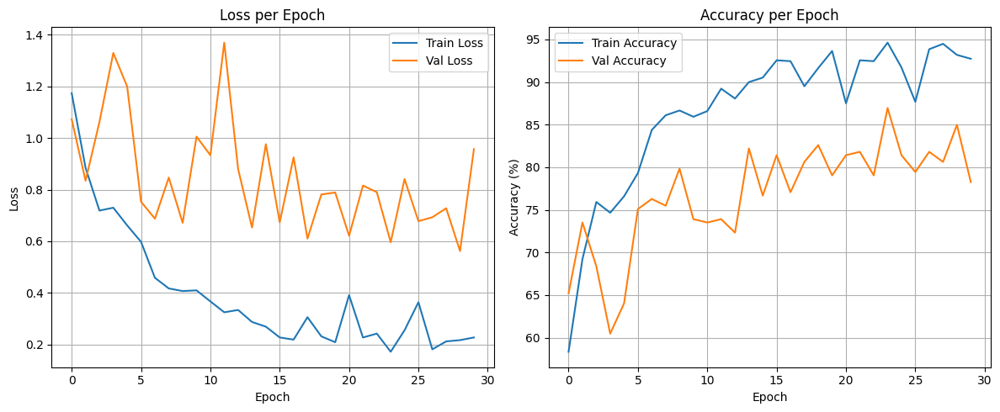

In [17]:
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np # Import numpy for plotting

# Define the loss function, optimizer, and learning rate scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3) # Use a slightly higher learning rate for the whole model
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.1, verbose=True)

# Training loop
num_epochs = 30 # Define the number of epochs for training

print(f"\nStarting training on balanced dataset for {num_epochs} epochs...")

train_losses = []
val_losses = []
train_accs = []
val_accs = []

best_val_acc = 0.0
# Initialize best_model_state to None or the initial state
best_model_state = model.state_dict()

for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    for images, labels in train_loader_balanced:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    epoch_train_loss = running_loss / len(train_loader_balanced)
    epoch_train_acc = 100.0 * correct_train / total_train

    # Validation phase
    model.eval()
    running_val_loss = 0.0
    correct_val = 0
    total_val = 0

    with torch.no_grad():
        for images, labels in val_loader_original: # Use val_loader_original
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_val += labels.size(0)
            correct_val += (predicted == labels).sum().item()

    epoch_val_loss = running_val_loss / len(val_loader_original) # Use val_loader_original
    epoch_val_acc = 100.0 * correct_val / total_val

    # Step the learning rate scheduler
    scheduler.step(epoch_val_loss)

    # Store metrics
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    train_accs.append(epoch_train_acc)
    val_accs.append(epoch_val_acc)

    # Save the best model
    if epoch_val_acc > best_val_acc:
        best_val_acc = epoch_val_acc
        best_model_state = model.state_dict()
        print(f"Epoch {epoch+1}: Validation accuracy improved to {best_val_acc:.2f}%. Saving model state.")


    print(f'Epoch [{epoch+1}/{num_epochs}], '
          f'Train Loss: {epoch_train_loss:.4f}, Train Acc: {epoch_train_acc:.2f}% | '
          f'Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%')

print("\nTraining finished.")

# Load the best model state dictionary
model.load_state_dict(best_model_state)
print(f"\nLoaded model state with best validation accuracy: {best_val_acc:.2f}%")

# Optional: Plot training and validation curves
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Train Accuracy')
plt.plot(val_accs, label='Val Accuracy')
plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## Evaluamos resultados del modelo ResNet18

Aca le daremos mucha atención a la precisión por clase y a las métricas de rendimiento general, tal cual como se expuso.


Evaluating the trained model on the original test set...

Classification Report:
              precision    recall  f1-score   support

   cardboard       0.97      0.83      0.89        41
       glass       0.65      0.90      0.76        50
       metal       0.87      0.83      0.85        41
       paper       0.77      0.92      0.84        59
     plastic       0.79      0.55      0.65        49
       trash       1.00      0.46      0.63        13

    accuracy                           0.79       253
   macro avg       0.84      0.75      0.77       253
weighted avg       0.81      0.79      0.79       253



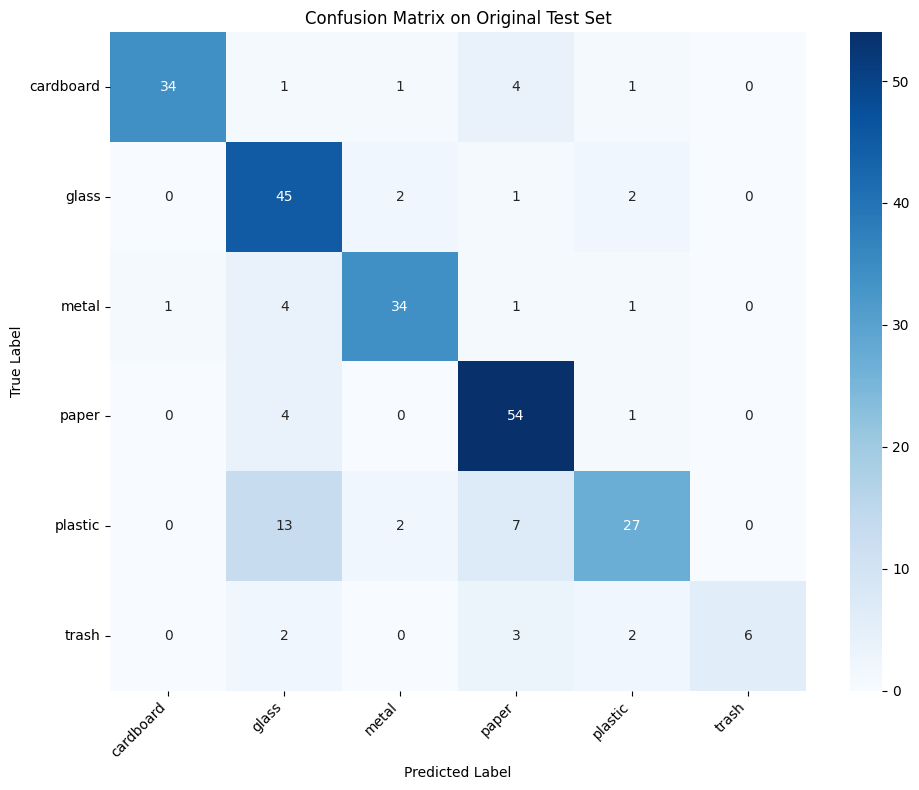


Evaluation on original test set completed.


In [18]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import numpy as np

# Evaluate the trained model on the original test set
print("\nEvaluating the trained model on the original test set...")

# Ensure model is on the correct device and in evaluation mode
model.to(device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader_original: # Use test_loader_original
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate and print the classification report
class_names = test_dataset_original.classes # Get class names from the test dataset
print("\nClassification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Calculate and plot the confusion matrix
cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix on Original Test Set')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print("\nEvaluation on original test set completed.")

Posteriormente guardamos el modelo entrenado para testearlo posteriormente

In [20]:
import torch
from google.colab import files

# Define the path to save the model
model_save_path = 'resnet18_trashnet_balanced.pth'

# Save the model state dictionary
torch.save(model.state_dict(), model_save_path)

print(f"Trained ResNet18 model saved to {model_save_path}")

# Provide a download link
files.download(model_save_path)

print("\nTask finished. The balanced training dataset is ready for training the ResNet50 model.")

Trained ResNet18 model saved to resnet18_trashnet_balanced.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


Task finished. The balanced training dataset is ready for training the ResNet50 model.
